# Yelp - Exploratory Data Analysis

<p><b>Yelp reviews.</b> The Yelp reviews dataset is obtained from the Yelp Dataset Challenge in 2015. This
dataset contains 1,569,264 samples that have review texts. Two classification tasks are constructed
from this dataset – one predicting full number of stars the user has given, and the other predicting a polarity label by considering stars 1 and 2 negative, and 3 and 4 positive. The full dataset
has 130,000 training samples and 10,000 testing samples in each star, and the polarity dataset has
280,000 training samples and 19,000 test samples in each polarity.</p>

https://papers.nips.cc/paper/5782-character-level-convolutional-networks-for-text-classification.pdf

# Yelp review full

## Imports

In [1]:
import tarfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_extraction.text import TfidfVectorizer

import warnings
warnings.filterwarnings('ignore')

sns.set()

## Input data

In [2]:
!wget -P ../../data https://s3.amazonaws.com/fast-ai-nlp/yelp_review_full_csv.tgz

with tarfile.open('../../data/yelp_review_full_csv.tgz') as tar:
    tar.extractall(path="../../data")

--2020-02-15 18:07:46--  https://s3.amazonaws.com/fast-ai-nlp/yelp_review_full_csv.tgz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.229.149
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.229.149|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 196146755 (187M) [application/x-tar]
Saving to: ‘../../data/yelp_review_full_csv.tgz’

yelp_review_full_cs 100%[===================>] 187.06M  1.14MB/s    in 95s     

2020-02-15 18:09:22 (1.97 MB/s) - ‘../../data/yelp_review_full_csv.tgz’ saved [196146755/196146755]



In [2]:
def get_data(version='full', mapping_labels=None):
    train = pd.read_csv('../../data/yelp_review_' + version + '_csv/train.csv', names=['label', 'text'])
    test = pd.read_csv('../../data/yelp_review_' + version + '_csv/test.csv', names=['label', 'text'])
    
    if mapping_labels:
        train['label'] = train['label'].apply(lambda x: mapping_labels[x])
        test['label'] = test['label'].apply(lambda x: mapping_labels[x])

    return train[['text']], train['label'], test[['text']], test['label']

In [3]:
x_train, y_train, x_test, y_test = get_data()

## Explore data

In [5]:
print(f'Train shape: {x_train.shape[0]}')
print(f'Test  shape: {x_test.shape[0]}')

Train shape: 650000
Test  shape: 50000


In [6]:
x_train.head()

,text
0,dr. goldberg offers everything i look for in a...
1,"Unfortunately, the frustration of being Dr. Go..."
2,Been going to Dr. Goldberg for over 10 years. ...
3,Got a letter in the mail last week that said D...
4,I don't know what Dr. Goldberg was like before...


In [7]:
y_train.head()

0    5
1    2
2    4
3    4
4    1
Name: label, dtype: int64

In [8]:
y_train.nunique()

5

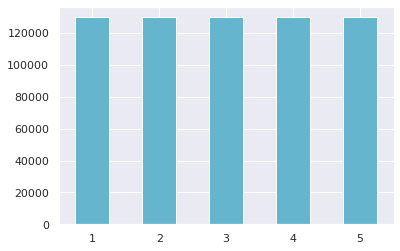

In [9]:
y_train.value_counts().sort_index().plot(kind='bar', color='c');
plt.xticks(rotation='horizontal');

In [10]:
y_test.nunique()

5

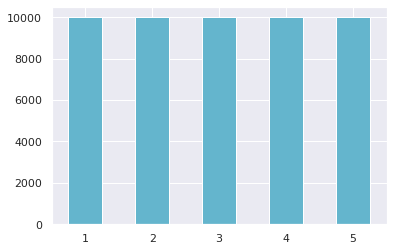

In [11]:
y_test.value_counts().sort_index().plot(kind='bar', color='c');
plt.xticks(rotation='horizontal');

Os rótulos estão balanceados.

### Analisando a quantidade de caracteres das sentenças:

In [12]:
x_train['len'] = x_train['text'].apply(len)
x_test['len'] = x_test['text'].apply(len)

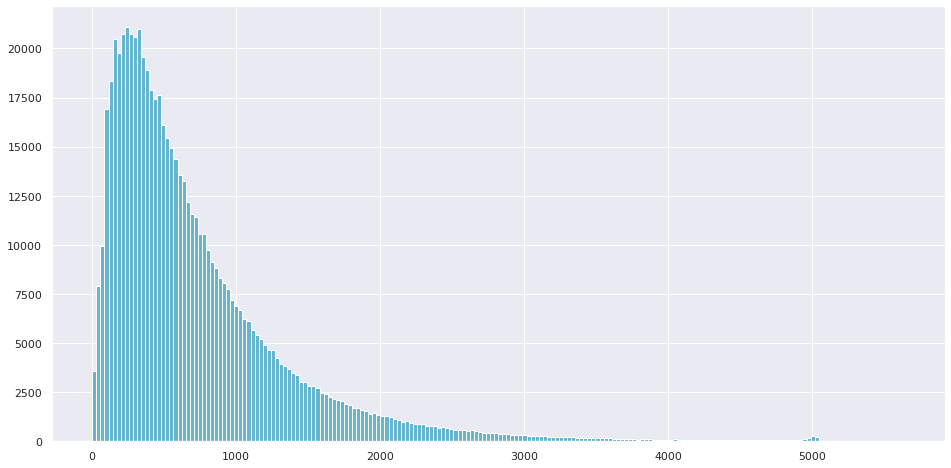

In [13]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

In [14]:
(x_train['len'] > 4000).sum()

2974

In [15]:
(x_train['len'] > 5000).sum()

452

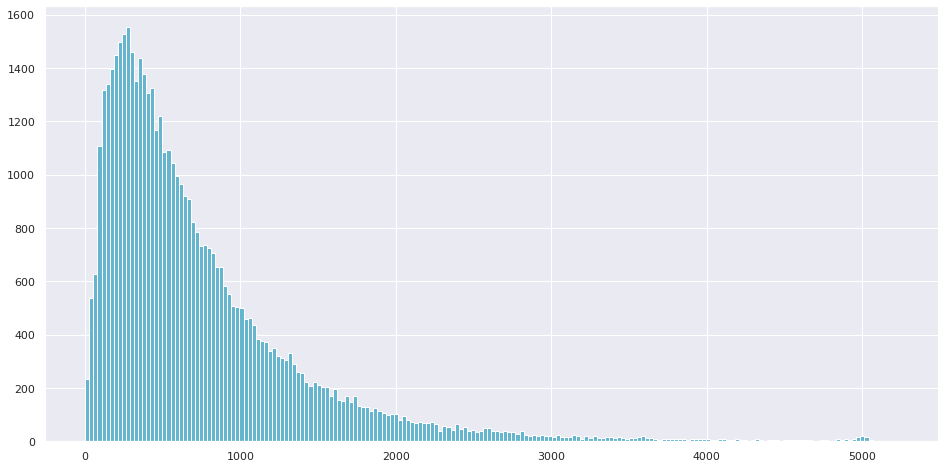

In [16]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

In [17]:
(x_test['len'] > 5000).sum()

36

A distribuição da quantidade de caracteres das setenças é inclinada a esquerda, tendo a maior parte do texto até 3000 caracteres, porém há a presença de sentenças maiores acima de 5000 caracteres.

### Analisando a quantidade de palavras:

In [18]:
x_train['len'] = x_train['text'].apply(lambda x: len(x.split()))
x_test['len'] = x_test['text'].apply(lambda x: len(x.split()))

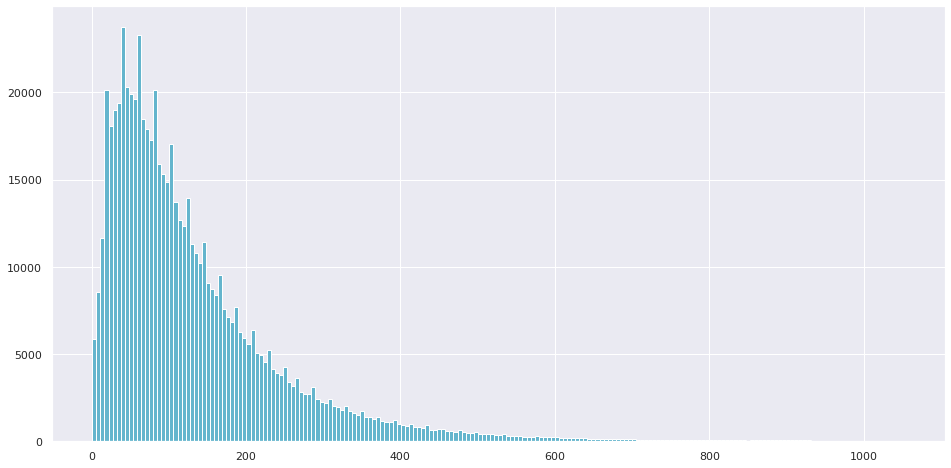

In [19]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

In [20]:
(x_train['len'] > 800).sum()

1941

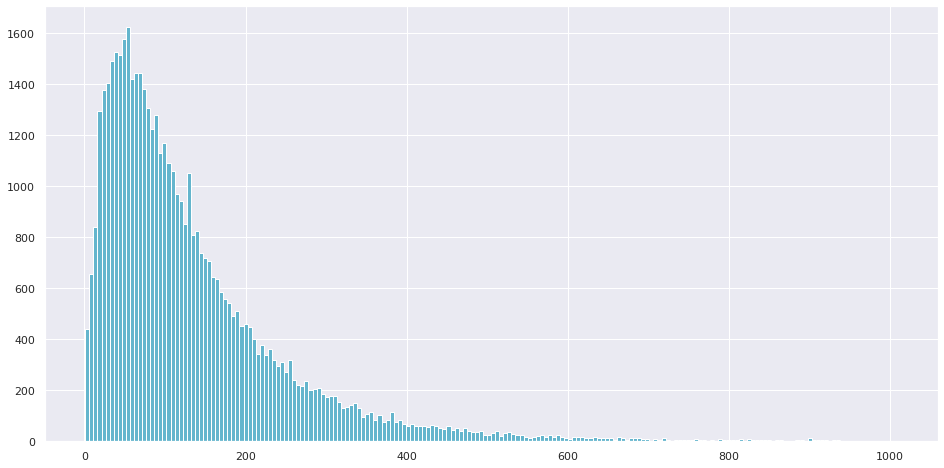

In [21]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

### Analisando a quantidade de palavras únicas:

In [22]:
x_train['len'] = x_train['text'].apply(lambda x: len(set(x.split())))
x_test['len'] = x_test['text'].apply(lambda x: len(set(x.split())))

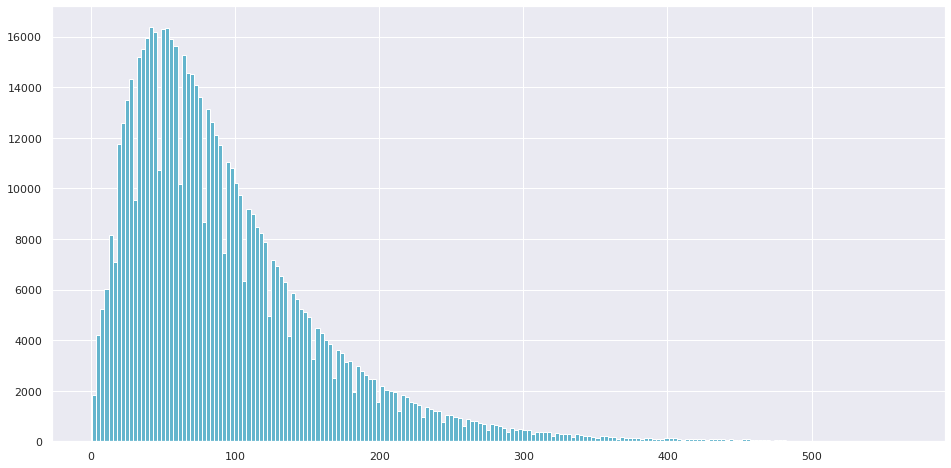

In [23]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

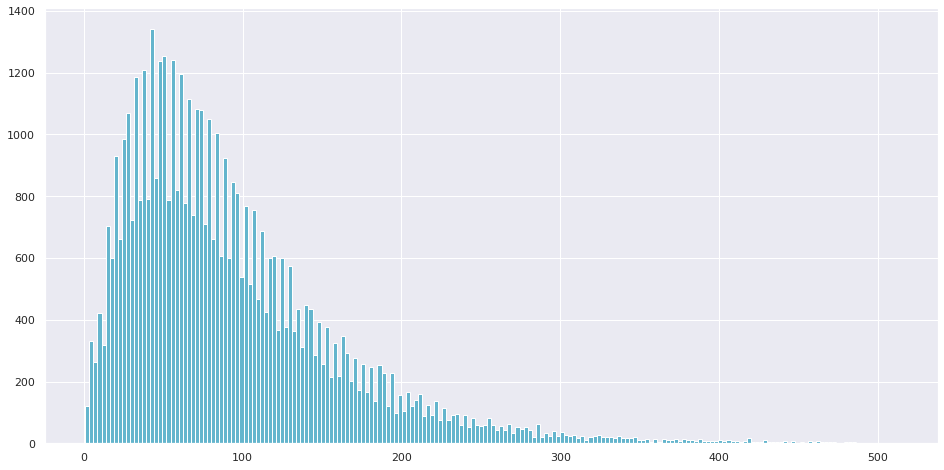

In [24]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

## Plotando as nuvens de palavras:

In [0]:
from wordcloud import WordCloud

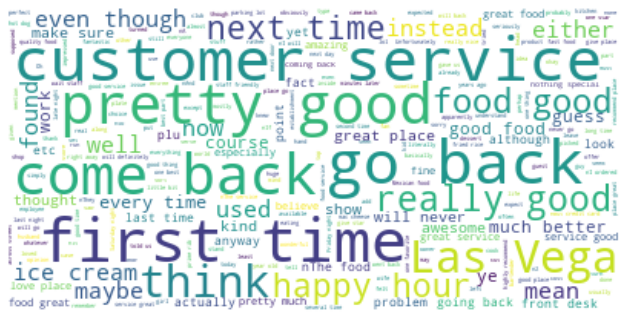

In [0]:
wordcloud = WordCloud(max_font_size=40, max_words=2000, relative_scaling=0, 
                      repeat=False, background_color="white")
wordcloud_geral = wordcloud.generate(' '.join(x_train['text']))

plt.figure(figsize=(11, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

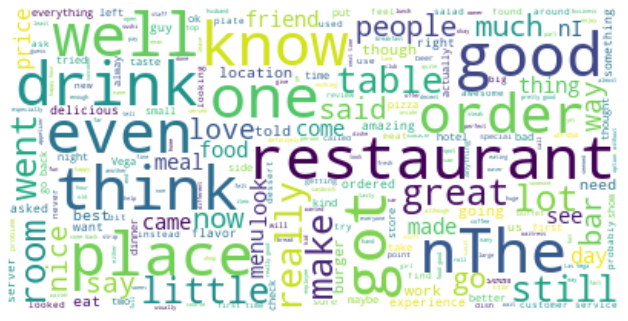

In [0]:
wordcloud = WordCloud(max_font_size=40, max_words=2000, relative_scaling=0, 
                      repeat=False, background_color="white")
wordcloud_geral = wordcloud.generate(' '.join(x_test['text']))

plt.figure(figsize=(11, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Modeling

In [4]:
vectorizer = TfidfVectorizer().fit(x_train['text'])

x_train = vectorizer.transform(x_train['text'])
x_test = vectorizer.transform(x_test['text'])

In [9]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.20972
precision: 0.23711199023031185
recall:    0.20972
f1_score:  0.1329867917862843


In [26]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.38386
precision: 0.3836162122477683
recall:    0.38386
f1_score:  0.38373551295373565


In [27]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.50476
precision: 0.49262919906508423
recall:    0.50476
f1_score:  0.4940450846549518


In [10]:
from sklearn.ensemble import AdaBoostClassifier

model = AdaBoostClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.47562
precision: 0.46492156430295406
recall:    0.47562
f1_score:  0.4655984712977172


In [ ]:
# from sklearn.neural_network import MLPClassifier

# model = MLPClassifier().fit(x_train, y_train)

# y_pred = model.predict(x_test)
# print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
# print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
# print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
# print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

In [ ]:
# from sklearn.svm import SVC

# model = SVC().fit(x_train, y_train)

# y_pred = model.predict(x_test)
# print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
# print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
# print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
# print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

## Feature importance

In [5]:
mapping_features = {}
for i, feat in enumerate(vectorizer.get_feature_names()):
    mapping_features[i] = feat

In [6]:
x_train.shape[1]

242886

In [7]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier().fit(x_train, y_train)

In [8]:
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print(f"{f + 1}. {mapping_features[indices[f]]} ({importances[indices[f]]})")
    if importances[indices[f]] == 0.0:
        break

Feature ranking:
1. but (0.00573258979325488)
2. great (0.0056477308000320026)
3. not (0.00538525799587289)
4. the (0.005142328705024697)
5. good (0.005073487838063836)
6. and (0.005072706548534164)
7. was (0.004607225423707656)
8. to (0.004439769088539677)
9. is (0.004190167374866083)
10. it (0.004105667811342509)
11. for (0.003742089141266763)
12. of (0.0036837151781759854)
13. this (0.0035615625379091073)
14. in (0.0034555472811620526)
15. food (0.003400423015346223)
16. best (0.0032383695302241906)
17. that (0.0031824669590322856)
18. my (0.0031820399538450717)
19. they (0.0031139647775691743)
20. with (0.003004276752983319)
21. no (0.0029623047308497095)
22. place (0.0029508515661863864)
23. you (0.0028820388485198095)
24. amazing (0.0028763740012083196)
25. on (0.0028472414060405483)
26. love (0.002835996877426716)
27. at (0.0027969222066510104)
28. have (0.002795723740087342)
29. service (0.002737472566514741)
30. are (0.002727991619881998)
31. had (0.002639479958220072)
32. ver

2193. smooth (6.324714944187912e-05)
2194. boba (6.318737114982821e-05)
2195. exciting (6.31324426034975e-05)
2196. saving (6.312648825604823e-05)
2197. hooked (6.30658976822428e-05)
2198. greatest (6.29911095685402e-05)
2199. cirque (6.297839534591894e-05)
2200. philly (6.297501974455968e-05)
2201. spaghetti (6.292868239417649e-05)
2202. tips (6.287301219057016e-05)
2203. 21 (6.285730569304837e-05)
2204. mandalay (6.281392433275522e-05)
2205. wines (6.27992533719585e-05)
2206. dude (6.276329744648088e-05)
2207. shell (6.272964744406585e-05)
2208. presented (6.272507744473341e-05)
2209. treats (6.27032270232827e-05)
2210. fashion (6.26672327557001e-05)
2211. inviting (6.254719766713888e-05)
2212. dumplings (6.253342007462731e-05)
2213. dad (6.25301739542923e-05)
2214. leftovers (6.244793113763026e-05)
2215. caught (6.241057472813528e-05)
2216. craft (6.232742895712504e-05)
2217. blown (6.230698501485135e-05)
2218. paris (6.227078698795222e-05)
2219. id (6.226949878503144e-05)
2220. los

4480. lease (2.0528330870485023e-05)
4481. national (2.052612435668918e-05)
4482. nsecond (2.0525824926287792e-05)
4483. thousand (2.0516081770649698e-05)
4484. infused (2.0510008172865788e-05)
4485. excitement (2.050469694961441e-05)
4486. 10am (2.0497636103813774e-05)
4487. centre (2.0497395432419892e-05)
4488. camera (2.0493451522967905e-05)
4489. stained (2.048924657557211e-05)
4490. moderately (2.0488270385672525e-05)
4491. stuffing (2.0476386198692355e-05)
4492. pulling (2.0475402633798033e-05)
4493. baguette (2.045881875255863e-05)
4494. unremarkable (2.044661330157176e-05)
4495. nupdate (2.0431750969474043e-05)
4496. 00pm (2.042941677719411e-05)
4497. signage (2.042749075351293e-05)
4498. arrives (2.04252846359587e-05)
4499. bump (2.039434219456072e-05)
4500. significant (2.03597636907105e-05)
4501. bulgogi (2.0359594274308507e-05)
4502. oriented (2.0350296396486212e-05)
4503. batch (2.0347063905281335e-05)
4504. oj (2.03283989125199e-05)
4505. nicht (2.0324122882732595e-05)
45

6644. adam (1.0235491084831264e-05)
6645. skins (1.023502802318116e-05)
6646. fritters (1.0234958864464685e-05)
6647. theory (1.0232230686022906e-05)
6648. bao (1.0229969569569984e-05)
6649. slapped (1.02281738865722e-05)
6650. comic (1.0224394835674745e-05)
6651. candied (1.0220038445069492e-05)
6652. goodbye (1.0213926102233904e-05)
6653. enthusiasm (1.0213180635890072e-05)
6654. pete (1.0213067411700598e-05)
6655. materials (1.021276256625598e-05)
6656. chalk (1.0210047133673823e-05)
6657. palette (1.0208103441331453e-05)
6658. generously (1.0194794088186617e-05)
6659. brave (1.0191272507616261e-05)
6660. nwait (1.0190483900213367e-05)
6661. mixes (1.0190187888041103e-05)
6662. owe (1.018285145346295e-05)
6663. ngive (1.0179343305690401e-05)
6664. transportation (1.0178026538652479e-05)
6665. perks (1.0174535799601819e-05)
6666. chimi (1.0173609812023924e-05)
6667. ethiopian (1.0172168456591907e-05)
6668. bogo (1.0171727743693112e-05)
6669. modest (1.017131079577869e-05)
6670. cuisi

8787. attracted (6.080875665857639e-06)
8788. koi (6.078386990245855e-06)
8789. pray (6.075973319000398e-06)
8790. decorate (6.074322208186875e-06)
8791. sis (6.073278747425761e-06)
8792. accurately (6.0728876621591755e-06)
8793. nim (6.070185694089149e-06)
8794. discovering (6.066956312185176e-06)
8795. decides (6.062865213002525e-06)
8796. tuscan (6.062196006734334e-06)
8797. medicore (6.0603560887607436e-06)
8798. etiquette (6.060284817189327e-06)
8799. burns (6.059955377497917e-06)
8800. clarify (6.059443729118189e-06)
8801. sleazy (6.059038143624937e-06)
8802. lvac (6.054252593865812e-06)
8803. stamps (6.053144302666208e-06)
8804. explosion (6.05314088180677e-06)
8805. neighborhoods (6.052908763004448e-06)
8806. rangoons (6.049848719161574e-06)
8807. commitment (6.049747382295136e-06)
8808. wit (6.048795875700421e-06)
8809. groove (6.04822112566856e-06)
8810. poppin (6.047505896385059e-06)
8811. lvh (6.044611875582855e-06)
8812. fascinating (6.044437151174064e-06)
8813. nmeh (6.04

11067. leaks (3.9824823585314456e-06)
11068. produits (3.982018667956521e-06)
11069. knacks (3.981687993600658e-06)
11070. bastard (3.980881523216866e-06)
11071. distract (3.980368373034975e-06)
11072. ngreen (3.979989456053531e-06)
11073. fashionable (3.978907453815022e-06)
11074. 3000 (3.978517258186578e-06)
11075. panels (3.97674032013992e-06)
11076. li (3.9766919585099e-06)
11077. repetitive (3.976605932507633e-06)
11078. testament (3.976568549344487e-06)
11079. hardwood (3.976495379322472e-06)
11080. oiled (3.976242496075879e-06)
11081. veterans (3.975792798434471e-06)
11082. everyones (3.9734368218364285e-06)
11083. vague (3.972846199159116e-06)
11084. communicated (3.9690092578475e-06)
11085. larry (3.968203448684993e-06)
11086. armed (3.967663243035131e-06)
11087. moly (3.967365740284761e-06)
11088. stainless (3.9665518038139225e-06)
11089. wonderland (3.965174780745753e-06)
11090. shish (3.962533391106517e-06)
11091. naverage (3.960999137676249e-06)
11092. amis (3.960127802011

13302. lumps (2.8140932658740583e-06)
13303. completing (2.814008667301792e-06)
13304. marine (2.8132259483982593e-06)
13305. salmonella (2.8131837622380148e-06)
13306. adored (2.811267140400715e-06)
13307. ceux (2.8104320560823202e-06)
13308. loosing (2.8104074933688047e-06)
13309. mel (2.8103812882544586e-06)
13310. fa (2.8103638301607746e-06)
13311. surgeon (2.810312243880296e-06)
13312. swings (2.8099098297266102e-06)
13313. xbox (2.8093110612859936e-06)
13314. maximize (2.8091629331774537e-06)
13315. wacky (2.8083687222218827e-06)
13316. daring (2.8082152588958785e-06)
13317. cheyenne (2.8081278741454046e-06)
13318. costed (2.8061551862618956e-06)
13319. paltry (2.806144082547786e-06)
13320. atl (2.8058651740519034e-06)
13321. din (2.805856364233919e-06)
13322. donating (2.805094344705105e-06)
13323. dignity (2.805003411719232e-06)
13324. boisterous (2.804670090013739e-06)
13325. nfound (2.804430657755329e-06)
13326. 2003 (2.8042882200757324e-06)
13327. scant (2.8042801768440493e-

15537. barbecued (2.091936995132758e-06)
15538. cora (2.091515021926297e-06)
15539. ailleurs (2.0910316721547814e-06)
15540. refundable (2.0904940134116935e-06)
15541. nalas (2.0903606197768354e-06)
15542. floyd (2.090158090281751e-06)
15543. coaching (2.0895869019930704e-06)
15544. fettucine (2.0895439287686953e-06)
15545. intelligence (2.089457589784707e-06)
15546. forno (2.0889167220987326e-06)
15547. producing (2.088792632871266e-06)
15548. slather (2.088443949628213e-06)
15549. nwhite (2.087381740844433e-06)
15550. gobs (2.0873399083443196e-06)
15551. celebs (2.0871685349617416e-06)
15552. hu (2.0868198033870276e-06)
15553. macho (2.0868090641500124e-06)
15554. mandy (2.0864064990420404e-06)
15555. stalk (2.08604899330456e-06)
15556. brewpub (2.0854668751291784e-06)
15557. ukffdfghhff (2.0848902600255084e-06)
15558. delicacy (2.084668385471268e-06)
15559. reign (2.08384214041087e-06)
15560. electro (2.0838327669609046e-06)
15561. ramekin (2.0833795063344965e-06)
15562. pozole (2.0

17671. biergarten (1.6107316067150641e-06)
17672. nproblem (1.6105402144928983e-06)
17673. packer (1.6104492516850005e-06)
17674. possession (1.6104329805785452e-06)
17675. doses (1.6104202280421636e-06)
17676. freed (1.610195870742023e-06)
17677. graces (1.6100713864655344e-06)
17678. nrip (1.610040980259303e-06)
17679. flashback (1.6097805564057443e-06)
17680. openness (1.6096501476642046e-06)
17681. unexceptional (1.609476715139885e-06)
17682. heath (1.609428267378948e-06)
17683. nameless (1.6090380218217693e-06)
17684. stacking (1.60901205193228e-06)
17685. cas (1.6089819453089532e-06)
17686. noverrated (1.6089443945238993e-06)
17687. faucets (1.608503765466516e-06)
17688. oft (1.6082233853858232e-06)
17689. spotlessly (1.6081142132360277e-06)
17690. empathetic (1.6079611428700053e-06)
17691. retrouve (1.607882327334252e-06)
17692. garde (1.6074949294023114e-06)
17693. wang (1.6074237621847075e-06)
17694. yeasty (1.6071549008284456e-06)
17695. strayed (1.6071417975448632e-06)
17696

19789. tagalog (1.281701690276392e-06)
19790. cookware (1.281474064427829e-06)
19791. superstar (1.2813544809730109e-06)
19792. adapt (1.2810462361549326e-06)
19793. nboyfriend (1.280955104463647e-06)
19794. shivering (1.2809492775692252e-06)
19795. mountainside (1.2806219000266236e-06)
19796. barkeep (1.2803804588022172e-06)
19797. sweatshirt (1.2803728340304955e-06)
19798. ports (1.280364428629894e-06)
19799. u00e9guli (1.280203558419209e-06)
19800. outraged (1.280180089025848e-06)
19801. bratty (1.2797088330652632e-06)
19802. droopy (1.2797082652509445e-06)
19803. xrays (1.279708224904915e-06)
19804. warrior (1.279375232087765e-06)
19805. affairs (1.279278510517896e-06)
19806. expedient (1.2792149070487418e-06)
19807. rellanos (1.2790345173444973e-06)
19808. nneeds (1.2789549213698074e-06)
19809. braving (1.278911246952311e-06)
19810. remixes (1.2786937158346746e-06)
19811. homeboy (1.2783578491616245e-06)
19812. martha (1.2781786906850443e-06)
19813. inconveniences (1.2779288412100

21984. whet (1.0359931331056092e-06)
21985. richie (1.0358177974815227e-06)
21986. sienna (1.0356643765961567e-06)
21987. swirling (1.0355604339152477e-06)
21988. vongole (1.0353812851814803e-06)
21989. sno (1.035339362945276e-06)
21990. ncrap (1.0353324269852043e-06)
21991. sued (1.0352182098869203e-06)
21992. jillian (1.0351853306828627e-06)
21993. shouts (1.0350868524800136e-06)
21994. borrowed (1.0350684826061548e-06)
21995. factories (1.0350544608243363e-06)
21996. acupuncture (1.0349525665279246e-06)
21997. pepiada (1.0347614702089146e-06)
21998. abridged (1.034738628002114e-06)
21999. minivan (1.0347178925474496e-06)
22000. pheonix (1.0347006854608127e-06)
22001. nstaying (1.0346845422551925e-06)
22002. tampa (1.0345671548558462e-06)
22003. tika (1.0345075501582155e-06)
22004. mcdouble (1.0344589178976317e-06)
22005. clint (1.034401811169821e-06)
22006. thaw (1.0343481324968129e-06)
22007. myst (1.0342370599771874e-06)
22008. exclusivity (1.0339467408929363e-06)
22009. starvatio

24247. scrolling (8.491110897594861e-07)
24248. arribas (8.490877984516448e-07)
24249. karai (8.490402850956411e-07)
24250. demos (8.488728040106525e-07)
24251. musste (8.486934401866069e-07)
24252. gypped (8.484551080297548e-07)
24253. termin (8.483567937834428e-07)
24254. vapors (8.482878339644213e-07)
24255. cardiologist (8.480380301304645e-07)
24256. submerged (8.478189468957609e-07)
24257. blunder (8.475744377531579e-07)
24258. u00e9picerie (8.474374774105286e-07)
24259. trifle (8.474215184784279e-07)
24260. romain (8.473315467460993e-07)
24261. orderer (8.471865780000845e-07)
24262. nscottsdale (8.471321262787342e-07)
24263. conch (8.471167810237059e-07)
24264. allowance (8.47030819093875e-07)
24265. resigned (8.470156570555828e-07)
24266. jodi (8.469758656761753e-07)
24267. somthing (8.469148858829444e-07)
24268. npittsburgh (8.466761822486678e-07)
24269. nametag (8.465918419874181e-07)
24270. trent (8.465530735613783e-07)
24271. outshined (8.465413479468736e-07)
24272. painless

26518. pah (7.082580032025248e-07)
26519. radiology (7.082096653920533e-07)
26520. erreur (7.081306656307198e-07)
26521. drifted (7.080851395286016e-07)
26522. 144 (7.080342437393444e-07)
26523. commercially (7.080272611529739e-07)
26524. nupdated (7.080129494859574e-07)
26525. och (7.07974773931891e-07)
26526. demerits (7.079562046885139e-07)
26527. cojita (7.078909136535339e-07)
26528. potholes (7.078228071733165e-07)
26529. entrepreneur (7.07780599162383e-07)
26530. scallopini (7.077629795539738e-07)
26531. gurgling (7.075181898265536e-07)
26532. primer (7.074920738120471e-07)
26533. soco (7.074557220096259e-07)
26534. bunky (7.074539164659141e-07)
26535. nquand (7.073255372681986e-07)
26536. mockery (7.071910360859756e-07)
26537. aliens (7.070794588683392e-07)
26538. inflate (7.070524739092703e-07)
26539. craftsman (7.069358822635989e-07)
26540. dishware (7.069225095769125e-07)
26541. airhead (7.068301104434682e-07)
26542. howdy (7.067812067320938e-07)
26543. joyous (7.067559211414

28719. regroup (6.03364938678377e-07)
28720. proceeding (6.033270645580695e-07)
28721. nielsen (6.033045277357382e-07)
28722. strawberrys (6.032123053560011e-07)
28723. refrigerate (6.031762865320135e-07)
28724. tht (6.03099219993762e-07)
28725. donning (6.029527144808178e-07)
28726. exorbitantly (6.029442508525601e-07)
28727. venerable (6.029063721828915e-07)
28728. nagiri (6.028917234227077e-07)
28729. boney (6.028110652496638e-07)
28730. ringling (6.027387266518376e-07)
28731. gearing (6.026749747336855e-07)
28732. immigrant (6.02642191447053e-07)
28733. nclam (6.026251338196101e-07)
28734. mitts (6.026198412745996e-07)
28735. theming (6.025794136085353e-07)
28736. toxins (6.02543251448632e-07)
28737. experimentation (6.025248814522997e-07)
28738. cristina (6.025138344975963e-07)
28739. stump (6.024952247363107e-07)
28740. pizzen (6.02476247850499e-07)
28741. magret (6.023650207858016e-07)
28742. foils (6.02357158549796e-07)
28743. transforms (6.021608806104088e-07)
28744. nchain (6

30881. invigorating (5.205813556526166e-07)
30882. nwild (5.204864043076795e-07)
30883. negated (5.204720964017489e-07)
30884. starvin (5.204253401081824e-07)
30885. snippets (5.203362045877516e-07)
30886. shavery (5.203319528968673e-07)
30887. achievement (5.202564589339231e-07)
30888. bribery (5.202482193879738e-07)
30889. marcella (5.200771438108925e-07)
30890. expediter (5.19998518585142e-07)
30891. knowledged (5.199981728348759e-07)
30892. nneutral (5.199841376368486e-07)
30893. cutbacks (5.199492369860862e-07)
30894. birkdale (5.199319178578438e-07)
30895. u00e4den (5.198917234168103e-07)
30896. strata (5.198521790892506e-07)
30897. mccaffrey (5.198093547710191e-07)
30898. reilly (5.197700436469429e-07)
30899. adamantly (5.197310321505883e-07)
30900. canister (5.197132092973072e-07)
30901. geri (5.196363188265974e-07)
30902. siberian (5.195814730641513e-07)
30903. nslowest (5.195546628764527e-07)
30904. nhead (5.195228303875882e-07)
30905. hearth (5.194951381070399e-07)
30906. 61

33119. vacuous (4.4964188942131114e-07)
33120. youngin (4.495495629751894e-07)
33121. sizzlers (4.494999208515058e-07)
33122. budlight (4.4949003478272467e-07)
33123. enigma (4.494692320420274e-07)
33124. tase (4.4941344759115664e-07)
33125. bavaria (4.49404278758378e-07)
33126. franchisees (4.4931409565557367e-07)
33127. ballagio (4.492892185192993e-07)
33128. nuns (4.492817621341178e-07)
33129. holen (4.492595984503189e-07)
33130. telltale (4.492554827784923e-07)
33131. coudn (4.4919048039313865e-07)
33132. citynorth (4.491346178432375e-07)
33133. neice (4.4911202171370763e-07)
33134. gummi (4.4910989116751136e-07)
33135. peterson (4.4910672068369973e-07)
33136. adolescent (4.491022961139181e-07)
33137. jilly (4.4910209110363854e-07)
33138. inexcusably (4.4907166960092626e-07)
33139. backdrops (4.490172009599754e-07)
33140. wetherspoon (4.489982323077875e-07)
33141. harkin (4.489658083790011e-07)
33142. centres (4.4893445236569635e-07)
33143. bharta (4.488987525351502e-07)
33144. pof

35347. pizzetta (3.9283595266426023e-07)
35348. ripper (3.928147782712049e-07)
35349. breakout (3.9278318749013913e-07)
35350. masalas (3.9277856693525745e-07)
35351. ouvrir (3.927725575406196e-07)
35352. haircare (3.927488768199494e-07)
35353. japenese (3.92743574442322e-07)
35354. homecooking (3.927434391014018e-07)
35355. hampered (3.927417246488431e-07)
35356. redevelopment (3.9268139962750476e-07)
35357. mutha (3.9267807432486863e-07)
35358. dartboard (3.926484501485273e-07)
35359. cherche (3.9262025713565954e-07)
35360. commando (3.926166306543917e-07)
35361. controversial (3.925961856642699e-07)
35362. nbroccoli (3.92512393654858e-07)
35363. eeeeek (3.9249032156065517e-07)
35364. jawed (3.9248980030633217e-07)
35365. fabuloso (3.924783889228111e-07)
35366. bogey (3.924775538984408e-07)
35367. casings (3.924555588307885e-07)
35368. retiree (3.924408058991799e-07)
35369. purring (3.9238992879121505e-07)
35370. nbuns (3.923568667334115e-07)
35371. equidistant (3.9233939183726977e-0

37555. kingston (3.470282907522873e-07)
37556. afield (3.470248476155797e-07)
37557. ihg (3.4701156926402e-07)
37558. mixups (3.469978080291534e-07)
37559. promt (3.4699272382533354e-07)
37560. thot (3.46985763762247e-07)
37561. erosion (3.4697402952965753e-07)
37562. ogre (3.469693754438694e-07)
37563. grinded (3.4695500026116244e-07)
37564. kream (3.4695496522764945e-07)
37565. lamby (3.468873511970381e-07)
37566. ergonomic (3.4688712297367755e-07)
37567. 00ish (3.46884462435021e-07)
37568. retarted (3.4686380963720814e-07)
37569. redish (3.4682256057228606e-07)
37570. diplomatic (3.468095157195324e-07)
37571. cheaped (3.467991623620763e-07)
37572. cecilia (3.4678295858429484e-07)
37573. pugs (3.467719640072947e-07)
37574. somwhere (3.467293391729449e-07)
37575. humbling (3.4671853129927933e-07)
37576. swilling (3.466993916045564e-07)
37577. ramped (3.4666726990310257e-07)
37578. dispensary (3.466641450137139e-07)
37579. handprints (3.466528327554852e-07)
37580. gawked (3.46620449877

39827. ngary (3.089199597461331e-07)
39828. multrees (3.088983088474447e-07)
39829. tutor (3.088865922180402e-07)
39830. lika (3.0888208513990643e-07)
39831. nametags (3.0884514094886115e-07)
39832. chos (3.088412487650178e-07)
39833. boutonniere (3.0884040397593594e-07)
39834. entrusted (3.0882708531794266e-07)
39835. valait (3.0879843643586394e-07)
39836. zzzzzzzzzzzzzz (3.08794248846503e-07)
39837. bado (3.087468481214504e-07)
39838. buyback (3.0870648336815357e-07)
39839. accelerated (3.087058545936363e-07)
39840. chanteur (3.0870260938115693e-07)
39841. cid (3.0867849784013893e-07)
39842. scot (3.086705103285716e-07)
39843. nperson (3.0861920913387314e-07)
39844. bellpepper (3.085986475460088e-07)
39845. reporters (3.0855926128269446e-07)
39846. lipped (3.0853575469209367e-07)
39847. scharf (3.0852020492524343e-07)
39848. buttt (3.0847806331807155e-07)
39849. xxxl (3.0846178762761713e-07)
39850. wht (3.0844642248128e-07)
39851. sullivans (3.084137387704317e-07)
39852. pinenut (3.0

42017. haemul (2.773434093672073e-07)
42018. sphincter (2.773272066212999e-07)
42019. lunchmates (2.772689915680246e-07)
42020. davantage (2.772605815389954e-07)
42021. briefing (2.7725512333323216e-07)
42022. ovaltine (2.772351571640588e-07)
42023. santiago (2.7723007360621005e-07)
42024. argus (2.772229678305853e-07)
42025. nhadn (2.7720416154677266e-07)
42026. poeple (2.771964068130516e-07)
42027. whiskys (2.7719532670873725e-07)
42028. lynchburg (2.771655163373437e-07)
42029. sundrops (2.7716094565534485e-07)
42030. blaaaaaaaaaand (2.771609318611416e-07)
42031. nruns (2.7715339813278396e-07)
42032. monumentally (2.7714723984570115e-07)
42033. bigtsreivews (2.771429933015799e-07)
42034. poundland (2.771386374150854e-07)
42035. towered (2.7710355242623734e-07)
42036. ngodspeed (2.77099040249667e-07)
42037. reachable (2.770954889069264e-07)
42038. carmellas (2.7708606384076063e-07)
42039. exxon (2.7708333855876405e-07)
42040. ndiablo (2.770819567212789e-07)
42041. sauternes (2.7705291

44369. innumerable (2.48079166677155e-07)
44370. wasbi (2.4807010167882186e-07)
44371. pealed (2.48061476723168e-07)
44372. nanna (2.4805184715488493e-07)
44373. fingerprinted (2.480314935890532e-07)
44374. worlde (2.480136855960529e-07)
44375. hocks (2.4799795954302526e-07)
44376. erfahrungen (2.479974675124116e-07)
44377. 495 (2.479917504966512e-07)
44378. nmargherita (2.4797694434584774e-07)
44379. peau (2.47942920014671e-07)
44380. u00e9leri (2.479411572085635e-07)
44381. ndurant (2.4793839853814507e-07)
44382. hoff (2.47927632350327e-07)
44383. friednly (2.4791280823808177e-07)
44384. wuings (2.479105488694235e-07)
44385. maintainance (2.479065001047516e-07)
44386. 12k (2.4790186881708016e-07)
44387. hendersonian (2.47899517058662e-07)
44388. morass (2.478966410423898e-07)
44389. ncraig (2.4789438608180237e-07)
44390. dojng (2.47891115538992e-07)
44391. schochu (2.4787755855854046e-07)
44392. kushiage (2.478557289450169e-07)
44393. mildest (2.4785190082643204e-07)
44394. gisantes 

46453. pleasance (2.2581121307824143e-07)
46454. jeera (2.2581005899223084e-07)
46455. suuuuuuper (2.258031310578751e-07)
46456. waterworld (2.2579553147127e-07)
46457. chenoy (2.2578804155392278e-07)
46458. tailgated (2.2578577312915524e-07)
46459. socking (2.2578189900839003e-07)
46460. 13pm (2.2576478938404205e-07)
46461. 33oz (2.2575782383072285e-07)
46462. immerhin (2.2574764131577974e-07)
46463. iheartradio (2.257395257468527e-07)
46464. sade (2.257058489288723e-07)
46465. closeted (2.2570314994387748e-07)
46466. scrounged (2.2570221338038187e-07)
46467. cnd (2.2569243037578014e-07)
46468. 560 (2.2569015748062809e-07)
46469. rockaberry (2.256880534968547e-07)
46470. ceptional (2.2568413374598642e-07)
46471. speedos (2.2567948374436604e-07)
46472. maccaroni (2.2566221609470346e-07)
46473. sashami (2.2565940595362668e-07)
46474. monstrosities (2.256441922819402e-07)
46475. cken (2.2564116011851846e-07)
46476. roa (2.2563162473762713e-07)
46477. tks (2.2560787424573742e-07)
46478. p

48708. nothign (2.0566128241974884e-07)
48709. amorous (2.056516229199139e-07)
48710. nsexy (2.0564294532623304e-07)
48711. beergarita (2.0564256257939844e-07)
48712. naturels (2.0563236545095565e-07)
48713. latching (2.0562920731339245e-07)
48714. geezus (2.0562189073313387e-07)
48715. litany (2.0560510790784744e-07)
48716. portovino (2.0558189777777365e-07)
48717. birdflu (2.055799433678323e-07)
48718. scorch (2.0556014866172975e-07)
48719. depict (2.0555436037796029e-07)
48720. 20p (2.0554984821109378e-07)
48721. prompty (2.0554084715160585e-07)
48722. carhops (2.05537277277425e-07)
48723. ul (2.0552162727804447e-07)
48724. raceway (2.0551644062915445e-07)
48725. pirouette (2.0551362522119475e-07)
48726. demeanour (2.0549793585672029e-07)
48727. coconutty (2.0549140899647666e-07)
48728. bresaola (2.0547857010616863e-07)
48729. scurred (2.0547558765742355e-07)
48730. ntreasure (2.0547358914164532e-07)
48731. pacquaio (2.0547296946313837e-07)
48732. arses (2.0546097412377587e-07)
4873

50937. u611f (1.8878162956454334e-07)
50938. buckling (1.8878140403118914e-07)
50939. plunging (1.8876156770276542e-07)
50940. raton (1.8875510283156859e-07)
50941. nhibachi (1.8875443647631023e-07)
50942. uninhabitable (1.8875074006198233e-07)
50943. victorias (1.8874079096607473e-07)
50944. cuttle (1.8873938756798078e-07)
50945. moniez (1.887372685925184e-07)
50946. alb (1.8873703442690394e-07)
50947. buuren (1.8872966988787406e-07)
50948. atmospehere (1.8872585462337992e-07)
50949. venom (1.8871917388207126e-07)
50950. subscriptions (1.8871582935261714e-07)
50951. c1 (1.8870726821556792e-07)
50952. bleghhh (1.886982460648792e-07)
50953. flameado (1.8869765128692306e-07)
50954. consoled (1.8869045679166157e-07)
50955. renouvellement (1.8868745031093716e-07)
50956. rugaloch (1.8867812364468624e-07)
50957. nfill (1.8866594897383444e-07)
50958. mwu (1.8866323132922865e-07)
50959. augh (1.8865723950579536e-07)
50960. becaues (1.8864984169699362e-07)
50961. tonorder (1.8863506127375422e-0

53116. empt (1.742786018584383e-07)
53117. nwishing (1.7426601726109615e-07)
53118. nspice (1.7426394535872268e-07)
53119. roofer (1.7424201123492387e-07)
53120. navailable (1.742382255834582e-07)
53121. lurve (1.7423522495750874e-07)
53122. ndolmas (1.7423446757678645e-07)
53123. meeh (1.7422607910181101e-07)
53124. popcornnnnnn (1.742185341416823e-07)
53125. conservancy (1.7421012516504763e-07)
53126. alder (1.7420483023302806e-07)
53127. omma (1.742028509297651e-07)
53128. brininess (1.7419019409794206e-07)
53129. zeitpunkt (1.7418274267970697e-07)
53130. bbabaganoush (1.7417909618819687e-07)
53131. tejano (1.7417568768054151e-07)
53132. giblets (1.7417319292791497e-07)
53133. shaby (1.7416205087443885e-07)
53134. workweek (1.7415276077534544e-07)
53135. meins (1.741504497426366e-07)
53136. disagreeing (1.7414763620368213e-07)
53137. briscuit (1.7414727708232785e-07)
53138. phyron (1.7413708760876434e-07)
53139. motore (1.7413567477924914e-07)
53140. dng (1.741290830912299e-07)
5314

55318. nmojitos (1.6172770886301183e-07)
55319. failings (1.6172560907008392e-07)
55320. nmonty (1.6171837061210993e-07)
55321. decal (1.6171408332790323e-07)
55322. gezeigt (1.6170284448940618e-07)
55323. conclusive (1.617022885937538e-07)
55324. athough (1.6170024288501314e-07)
55325. nbj (1.6169201684983413e-07)
55326. 30oz (1.61690127717819e-07)
55327. offereing (1.616836812625389e-07)
55328. karrage (1.6168336674281694e-07)
55329. rideable (1.6167309898134744e-07)
55330. allerlei (1.61668888114326e-07)
55331. dropkick (1.6165692938721882e-07)
55332. u00e9ateur (1.6165616860603042e-07)
55333. hmmmmmmmm (1.616316909925341e-07)
55334. 4pcs (1.6161288423982076e-07)
55335. streawberry (1.6161056587037303e-07)
55336. frozenness (1.6160956841387263e-07)
55337. paree (1.6160788662099478e-07)
55338. conviendra (1.616018962626217e-07)
55339. shima (1.6160109812823124e-07)
55340. acupressure (1.6159519392015015e-07)
55341. pharmaceuticals (1.6159134220815586e-07)
55342. ausgezeichnet (1.6159

57614. fountaint (1.5009091284268633e-07)
57615. oaf (1.5007928213679738e-07)
57616. apprehended (1.5006314766916293e-07)
57617. unbooked (1.5006270416959119e-07)
57618. obi (1.500583258389434e-07)
57619. deguelasse (1.5004940217780754e-07)
57620. fancily (1.500447042028277e-07)
57621. u00e9clairage (1.5003923515012252e-07)
57622. ntakoyaki (1.5003092737716524e-07)
57623. refreshers (1.5001327101372989e-07)
57624. u00f8g (1.499974693801098e-07)
57625. 615pm (1.4998155519794525e-07)
57626. lamotte (1.4997670091308253e-07)
57627. ibm386 (1.4997598353961066e-07)
57628. firewater (1.499476624142213e-07)
57629. hierbei (1.4994555207513166e-07)
57630. officiating (1.4993180270152284e-07)
57631. demonico (1.4992963947215817e-07)
57632. pilipino (1.4992510880814562e-07)
57633. unsteady (1.4992074669481429e-07)
57634. leaden (1.499201630411462e-07)
57635. gemologist (1.499150891542441e-07)
57636. wartet (1.4991219405328887e-07)
57637. aufenthalt (1.4991037891664155e-07)
57638. aina (1.499095487

59828. nsex (1.3964152064323548e-07)
59829. sensationnelle (1.3964052398114488e-07)
59830. gogogo (1.396168610501518e-07)
59831. breakfas (1.3960388206845443e-07)
59832. toringdon (1.3960358460293484e-07)
59833. exponential (1.3960037500545403e-07)
59834. nsuperior (1.395995961979202e-07)
59835. felipes (1.3959391942590097e-07)
59836. suppress (1.395911718227636e-07)
59837. 17am (1.3958704308805849e-07)
59838. secco (1.395854595518349e-07)
59839. disrespects (1.39581833475059e-07)
59840. chinotto (1.3957903324209562e-07)
59841. nbangkok (1.3957775352683902e-07)
59842. schlimmer (1.3957136488582557e-07)
59843. majestically (1.395705719237511e-07)
59844. urbaine (1.3956566912933265e-07)
59845. keanu (1.395656541102438e-07)
59846. neanie (1.3956398123290013e-07)
59847. u00e9changer (1.3956301707078686e-07)
59848. unimaginitive (1.3955998943821022e-07)
59849. purused (1.3955639696246005e-07)
59850. sluggishness (1.3954955456034197e-07)
59851. untrimmed (1.3953906451285067e-07)
59852. terre

62179. macarran (1.303416532434241e-07)
62180. letcha (1.303315363010201e-07)
62181. appalls (1.3033076221019558e-07)
62182. retouched (1.3032891309570673e-07)
62183. perogy (1.3032763132318527e-07)
62184. 1490 (1.303238793254861e-07)
62185. simpleminded (1.303230116272163e-07)
62186. backsplash (1.3031773855619695e-07)
62187. seachickens (1.3031528471416994e-07)
62188. repackaging (1.3029817665881693e-07)
62189. truths (1.302973146496084e-07)
62190. brauchen (1.3029692284078e-07)
62191. puddng (1.3029510429386347e-07)
62192. premiered (1.302904297225238e-07)
62193. nbrother (1.302896959691172e-07)
62194. nstate (1.302886076054375e-07)
62195. inanimate (1.3028261004225966e-07)
62196. unaccountable (1.3028051495235767e-07)
62197. girlfirend (1.3027967654920046e-07)
62198. binagoongang (1.3027027898855465e-07)
62199. scandalized (1.3026924028152472e-07)
62200. nnicht (1.3026739319086848e-07)
62201. raconte (1.3026443653856782e-07)
62202. proposer (1.3026150111483445e-07)
62203. tapat (1.

64395. elleck (1.2238248099767449e-07)
64396. morgenpost (1.2238215812922963e-07)
64397. addictional (1.223820257450328e-07)
64398. chardonney (1.2238065861638836e-07)
64399. deion (1.2237606942726515e-07)
64400. reflectors (1.2237555745130256e-07)
64401. backroads (1.2236966166011717e-07)
64402. musells (1.2236421803033735e-07)
64403. cocooned (1.223628575233733e-07)
64404. ihomes (1.2236210252577042e-07)
64405. casavino (1.2235505026183724e-07)
64406. ninexcusably (1.223543805165219e-07)
64407. wtfffff (1.2235327602556259e-07)
64408. moistureless (1.223522759773298e-07)
64409. verweilen (1.2234830049313068e-07)
64410. dragonwell (1.2234640827850562e-07)
64411. 36oz (1.2234501151008953e-07)
64412. chor (1.2234122387553866e-07)
64413. swedishes (1.2233706439925217e-07)
64414. senario (1.2233480735076204e-07)
64415. waaaayyyyyyy (1.2233212867637034e-07)
64416. spellings (1.2233212763742305e-07)
64417. pizzera (1.223311724663255e-07)
64418. apizza (1.2232977426898186e-07)
64419. matalan 

66650. wahlberg (1.1486017538604179e-07)
66651. flixster (1.1485348065928405e-07)
66652. dais (1.1485102477167303e-07)
66653. mehbq (1.1485049431139043e-07)
66654. wal_mart (1.1484681630255066e-07)
66655. abhebt (1.1484566648128293e-07)
66656. sternum (1.1484425575455669e-07)
66657. demoralizing (1.1484141100985165e-07)
66658. containment (1.1484012389553258e-07)
66659. rotol (1.1483976042963539e-07)
66660. swankiness (1.1483719145861834e-07)
66661. altes (1.1483666378639158e-07)
66662. 1889 (1.1483387961717434e-07)
66663. kettbells (1.1483071043093497e-07)
66664. mediterane (1.1482920248679136e-07)
66665. gardeners (1.148249607499705e-07)
66666. youtube_gdata_player (1.148238806575524e-07)
66667. chide (1.1482196724175034e-07)
66668. nullement (1.148153283300931e-07)
66669. magnification (1.148149242298859e-07)
66670. hre (1.1481329220270504e-07)
66671. overprized (1.1481183720491887e-07)
66672. nhillstone (1.1480638292150707e-07)
66673. intamicy (1.1480623628354332e-07)
66674. nop (1

68945. stlll (1.0823033583725998e-07)
68946. clo (1.0822643745488569e-07)
68947. nvosges (1.0822356551313928e-07)
68948. revolvers (1.082217921890224e-07)
68949. backline (1.0821847266812641e-07)
68950. nhabitant (1.0821846427895667e-07)
68951. hollah (1.0821608951694582e-07)
68952. fhey (1.0821539413758974e-07)
68953. nieve (1.0821501754029172e-07)
68954. sapped (1.0821280049699468e-07)
68955. campaigns (1.0821159629465513e-07)
68956. spectating (1.0821063230583928e-07)
68957. frks (1.0820922226479185e-07)
68958. fruitier (1.0820794068594466e-07)
68959. nvisa (1.0820586708547602e-07)
68960. attirante (1.0820396242265019e-07)
68961. pings (1.0819859500097208e-07)
68962. kinaree (1.0819685023911397e-07)
68963. drunktards (1.0819166043160302e-07)
68964. nstood (1.0819157805279123e-07)
68965. giligan (1.0819050959697155e-07)
68966. tttooo (1.0818960635729142e-07)
68967. bussel (1.0818611174838686e-07)
68968. foodz (1.0818485064112806e-07)
68969. staind (1.0818451900333236e-07)
68970. spin

71082. u00e9cipitez (1.0264162535298635e-07)
71083. boater (1.0263970333933243e-07)
71084. lmahepvbyukdmorwinbaoa (1.0263678491468023e-07)
71085. nterminal (1.02636699054942e-07)
71086. kosmo (1.0263333713704695e-07)
71087. areolas (1.026272827555274e-07)
71088. newage (1.0262691022751911e-07)
71089. tryign (1.0262669485679108e-07)
71090. voom (1.0261382589350997e-07)
71091. adopters (1.026111905424665e-07)
71092. sweetex (1.026107993673029e-07)
71093. i485 (1.0260995401754577e-07)
71094. madsconnie (1.0260849257527766e-07)
71095. tozai (1.026073742502685e-07)
71096. tarting (1.0260649287601044e-07)
71097. incredibley (1.0260438638437584e-07)
71098. cordiale (1.026019114176555e-07)
71099. vigor (1.0260096105769696e-07)
71100. mastercraft (1.0259991673334738e-07)
71101. queit (1.0259697233575092e-07)
71102. blowpop (1.0259680273891145e-07)
71103. nrolling (1.0259379135438888e-07)
71104. parable (1.0259369400238847e-07)
71105. serviche (1.0259273126772541e-07)
71106. cldnt (1.02591487871

73240. npcg (9.729003736999922e-08)
73241. dificulty (9.728358547297555e-08)
73242. torric (9.728358436838478e-08)
73243. biiig (9.728041119960103e-08)
73244. spangles (9.726873403637711e-08)
73245. verfahren (9.726729676983112e-08)
73246. napol (9.726604233146012e-08)
73247. redefines (9.726584548166258e-08)
73248. commercialize (9.726413294667721e-08)
73249. schweeet (9.726412862779637e-08)
73250. quafable (9.726091135840965e-08)
73251. wynnn (9.72606504334341e-08)
73252. toughie (9.725889666708125e-08)
73253. reaping (9.725254702052328e-08)
73254. pwned (9.725181505967963e-08)
73255. apologixe (9.7250280847431e-08)
73256. nzia (9.72498135596957e-08)
73257. nogado (9.724943182639118e-08)
73258. raggy (9.724759227408495e-08)
73259. accountants (9.724452237770815e-08)
73260. ncaci (9.724403875619295e-08)
73261. pinor (9.7242627439191e-08)
73262. impressesd (9.724152023799992e-08)
73263. crests (9.723569131129234e-08)
73264. barstock (9.723149925118479e-08)
73265. wussten (9.72308077867

75237. amare (9.28188439304676e-08)
75238. spirite (9.281719627049057e-08)
75239. 0090 (9.281209700449718e-08)
75240. stoneys (9.281095718769257e-08)
75241. dblta (9.280797805797585e-08)
75242. gslis (9.280733908523891e-08)
75243. yessed (9.280647363347839e-08)
75244. pejorative (9.280607074844562e-08)
75245. phoniex (9.280478446988025e-08)
75246. increadibly (9.280434442045403e-08)
75247. shitton (9.280317998162572e-08)
75248. sodom (9.280279004501326e-08)
75249. imx (9.2799680540161e-08)
75250. maladroit (9.279694583823612e-08)
75251. proximal (9.279362225952001e-08)
75252. wiaa (9.279327649680557e-08)
75253. fillem (9.279248367994712e-08)
75254. chatani (9.279204865886785e-08)
75255. nummmm (9.278935023518723e-08)
75256. responseability (9.278836396381706e-08)
75257. propeitor (9.278761120465874e-08)
75258. 3gs (9.278076255472218e-08)
75259. trimethylamine (9.277788802084783e-08)
75260. slurpy (9.277787356918388e-08)
75261. baraccho (9.277612444601979e-08)
75262. 1080 (9.27706407248

77456. aroud (8.799904779382936e-08)
77457. delious (8.799859548105965e-08)
77458. enchladas (8.799849938985769e-08)
77459. disappopinted (8.799331907662358e-08)
77460. airmiles (8.799255059449456e-08)
77461. nothi9ng (8.79902908253851e-08)
77462. howeverthe (8.798968615762163e-08)
77463. deadlift (8.798958722874939e-08)
77464. minuscules (8.798714919216151e-08)
77465. dubin (8.798213533794007e-08)
77466. telenovelas (8.798145160231929e-08)
77467. hwe (8.797585299733994e-08)
77468. prchasing (8.797410484800571e-08)
77469. wren (8.797365144732833e-08)
77470. 12mid (8.797240181264727e-08)
77471. tablw (8.79711666316908e-08)
77472. gulag (8.79709448478668e-08)
77473. giness (8.796782477443972e-08)
77474. yahhhh (8.796692166173777e-08)
77475. erhielten (8.796389570963255e-08)
77476. salsify (8.796382232338971e-08)
77477. dallmyr (8.796073692146434e-08)
77478. nuovo (8.795673913067918e-08)
77479. shalom (8.795586814422557e-08)
77480. dreyfus (8.795178784289792e-08)
77481. knuspriges (8.7951

79673. stehbereich (8.360179658319792e-08)
79674. brang (8.359969556493879e-08)
79675. agavero (8.359552987950873e-08)
79676. ncomputer (8.3595289965554e-08)
79677. neeeeeext (8.359347769953359e-08)
79678. caaaaame (8.359275391894124e-08)
79679. honeyyyy (8.35890808245518e-08)
79680. handsdown (8.358903487167258e-08)
79681. sunomo (8.35883721623686e-08)
79682. slammered (8.358831270419667e-08)
79683. unhook (8.358656937956329e-08)
79684. nationalistic (8.358058041684163e-08)
79685. tzimmies (8.357932122782149e-08)
79686. capaccino (8.357730380941645e-08)
79687. gegenteil (8.357506772320712e-08)
79688. atoon (8.356790477702801e-08)
79689. anny (8.356757874003898e-08)
79690. avertis (8.356657454156432e-08)
79691. selbe (8.35660685660282e-08)
79692. coexist (8.356434982158267e-08)
79693. nkailua (8.356383153430422e-08)
79694. defiled (8.356317974196504e-08)
79695. toddys (8.35627442565715e-08)
79696. folkland (8.356191580381138e-08)
79697. eggstract (8.356186264638205e-08)
79698. bernieos

81853. u4e14 (7.96071404768632e-08)
81854. lucite (7.96022569269822e-08)
81855. barnard (7.960039653625863e-08)
81856. u00fasica (7.959937823973622e-08)
81857. litteral (7.959428761435334e-08)
81858. airtight (7.959231243465401e-08)
81859. npolenta (7.958655904086189e-08)
81860. ncapriotti (7.958593891771983e-08)
81861. loooooveeee (7.958573858788816e-08)
81862. ibbys (7.958561409624126e-08)
81863. teradito (7.958446398457477e-08)
81864. technicolour (7.958415496158653e-08)
81865. retardant (7.958332978123436e-08)
81866. fonds (7.95829721375874e-08)
81867. miswak (7.958243851988307e-08)
81868. fejoada (7.958207252898739e-08)
81869. sulis (7.95818584040879e-08)
81870. satisfries (7.958010302390922e-08)
81871. systemgastronomie (7.9574846660908e-08)
81872. consultative (7.957414654155576e-08)
81873. paralell (7.957362746948625e-08)
81874. muahaha (7.956968337541835e-08)
81875. scottsdalites (7.956913934094269e-08)
81876. oshibori (7.956761871494297e-08)
81877. floridinos (7.9565794203222

84044. uff01its (7.592896348005235e-08)
84045. belladerma (7.592822047873771e-08)
84046. u00e4ngerinnen (7.592755455384037e-08)
84047. preemptively (7.592496052100457e-08)
84048. 232 (7.592317124749496e-08)
84049. buttercr (7.59214671916659e-08)
84050. nnied (7.591845365335098e-08)
84051. cabocha (7.59174095511374e-08)
84052. wynot (7.591500632373677e-08)
84053. wesa (7.591310561297952e-08)
84054. bronte (7.591208142990673e-08)
84055. nunfotunately (7.59118189138775e-08)
84056. mystify (7.590826215990208e-08)
84057. sarciado (7.590712366325613e-08)
84058. allsaints (7.590697785057514e-08)
84059. compltely (7.590464212193308e-08)
84060. taftoon (7.59012960510823e-08)
84061. fenomenal (7.589193123820032e-08)
84062. supierior (7.589125640493284e-08)
84063. wekopa (7.588940486507424e-08)
84064. margeurita (7.588928222897927e-08)
84065. peurivan (7.588791119168285e-08)
84066. alin (7.588751483102231e-08)
84067. npanini (7.588489836805587e-08)
84068. optomism (7.588266553697292e-08)
84069. t

86208. technicial (7.24413327067692e-08)
86209. projectionist (7.243987400722708e-08)
86210. amnt (7.243663466921746e-08)
86211. dejorno (7.243136318462019e-08)
86212. nnann (7.243044893907122e-08)
86213. mazza (7.243004598334327e-08)
86214. enitre (7.242815771980774e-08)
86215. marconi (7.242639728834902e-08)
86216. pakistanian (7.24261557291423e-08)
86217. alamode (7.242321315500681e-08)
86218. unzufrieden (7.242286227881512e-08)
86219. 60minutes (7.242219734960986e-08)
86220. naccept (7.241980212315582e-08)
86221. gersons (7.24164537034344e-08)
86222. abriana (7.241537423986753e-08)
86223. zagged (7.241302906072232e-08)
86224. revile (7.241278254189827e-08)
86225. nahegelegene (7.241159689559463e-08)
86226. 1000w (7.240938160805583e-08)
86227. douteuses (7.240777680976865e-08)
86228. wallowing (7.240555869319087e-08)
86229. nedible (7.240300018128227e-08)
86230. zange (7.240076391436873e-08)
86231. wardrobing (7.239988073831937e-08)
86232. nazuza (7.239760313117548e-08)
86233. hered

88424. asc (6.902212785303079e-08)
88425. individualit (6.90209336513536e-08)
88426. oasian (6.90204501641035e-08)
88427. nmaize (6.901993416037096e-08)
88428. nnello (6.901959027925472e-08)
88429. nswords (6.901810595328652e-08)
88430. 1qfbfkhfry26sfahv2_glq (6.901307308982543e-08)
88431. 1893 (6.901130693915344e-08)
88432. disguested (6.90094996113783e-08)
88433. hallah (6.900825859997067e-08)
88434. infills (6.900622200405004e-08)
88435. perrotto (6.900569056023334e-08)
88436. parmessan (6.900452594791008e-08)
88437. entrancw (6.900445507643804e-08)
88438. hornbach (6.900315648209793e-08)
88439. longshoremen (6.900183999320189e-08)
88440. michealada (6.900067009632749e-08)
88441. sauver (6.89943650760645e-08)
88442. 759 (6.899205153964542e-08)
88443. execuse (6.899183940354813e-08)
88444. officing (6.899008642014881e-08)
88445. houseblends (6.898896739329281e-08)
88446. maan (6.898699950018488e-08)
88447. waaaaayy (6.898504140294443e-08)
88448. kaylan (6.898282430914257e-08)
88449. 

90751. downslope (6.576807308949801e-08)
90752. jambayla (6.576700525610139e-08)
90753. goatcheese (6.576626979954879e-08)
90754. vergara (6.57662119183418e-08)
90755. stimulater (6.576612311307308e-08)
90756. uge (6.576119253417567e-08)
90757. guh (6.576118099567908e-08)
90758. edmonsons (6.576007209085951e-08)
90759. paramore (6.575907243624239e-08)
90760. hnmmm (6.575786771239656e-08)
90761. dermalogica (6.575546761030207e-08)
90762. callng (6.57527041935967e-08)
90763. mola (6.575038608274202e-08)
90764. zereshk (6.574937908355582e-08)
90765. sweett (6.574697988885234e-08)
90766. gazooks (6.57465850845082e-08)
90767. looooovee (6.574624850313169e-08)
90768. aaall (6.574526817532276e-08)
90769. wonferful (6.574347967068542e-08)
90770. fishermans (6.574152584879343e-08)
90771. ndylan (6.573985162985023e-08)
90772. frot (6.573848009531018e-08)
90773. funkadelic (6.573735763788098e-08)
90774. u8089 (6.573617869732186e-08)
90775. landeros (6.57355309473258e-08)
90776. mst (6.57347656262

92950. espirit (6.286881270336822e-08)
92951. u00e9coeurer (6.286495221192608e-08)
92952. nvicki (6.286464205607838e-08)
92953. orgeganos (6.286380945547289e-08)
92954. torrentially (6.286266836091274e-08)
92955. welkom (6.286049167132739e-08)
92956. dayquil (6.285773213538686e-08)
92957. ngeorganne (6.285157787554877e-08)
92958. onna (6.285114002584822e-08)
92959. peccadillo (6.284788849650643e-08)
92960. rosson (6.284514129800246e-08)
92961. galaktoboutiko (6.284460840347062e-08)
92962. u00e4nkter (6.284415092951735e-08)
92963. ngerade (6.284265071068993e-08)
92964. dresener (6.284085568268366e-08)
92965. nvhs (6.283964850592496e-08)
92966. vaccumm (6.283892592370652e-08)
92967. nwaits (6.283788619270859e-08)
92968. soming (6.28367795593149e-08)
92969. kangkong (6.283569442594155e-08)
92970. tradesource (6.283529366946584e-08)
92971. grrrrrreeeeaaaat (6.28351657160309e-08)
92972. bus7 (6.283420539099867e-08)
92973. nische (6.283372895682005e-08)
92974. consversation (6.28335586736287

95194. negotiator (5.997793989793939e-08)
95195. fyr (5.997742351488402e-08)
95196. bothas (5.997669830600787e-08)
95197. disneyfied (5.997109595735008e-08)
95198. sanfu (5.996983622211315e-08)
95199. nsprinkle (5.996944531661807e-08)
95200. sek (5.996926643315905e-08)
95201. foiiiine (5.996923370388045e-08)
95202. aabc (5.996372040703611e-08)
95203. turistas (5.995981971264868e-08)
95204. taureau (5.995761766471245e-08)
95205. 11min (5.995739667914715e-08)
95206. dooo (5.995281854277589e-08)
95207. typcially (5.995137579226134e-08)
95208. tinkling (5.995071772137485e-08)
95209. nproximo (5.995000164652554e-08)
95210. claustrophobically (5.994816730072825e-08)
95211. perforated (5.994661321074222e-08)
95212. dedee (5.99457123927226e-08)
95213. offter (5.994563265087751e-08)
95214. appearences (5.99444605749611e-08)
95215. jenne (5.994407617657655e-08)
95216. frds (5.994329227751848e-08)
95217. u00c9l (5.993984468576462e-08)
95218. ipoop (5.993889445424219e-08)
95219. nlively (5.9937632

97185. pfqdbi (5.770616815903151e-08)
97186. fetishist (5.770614849351177e-08)
97187. nummies (5.770614290862485e-08)
97188. macaronphile (5.770613697142547e-08)
97189. ccmsi (5.7706085748155454e-08)
97190. freezeing (5.770607034092513e-08)
97191. savourly (5.770599606214645e-08)
97192. chiclets (5.7705914035751864e-08)
97193. americanzed (5.770590805331773e-08)
97194. repricing (5.7705900395904776e-08)
97195. 8pfund (5.7705896918966433e-08)
97196. heyjoetruck (5.770585295135591e-08)
97197. interagir (5.7705822143610635e-08)
97198. sessh (5.77058218548718e-08)
97199. afterwhich (5.7705817486063595e-08)
97200. sohlen (5.770571338525272e-08)
97201. specie (5.7705699006476944e-08)
97202. breadwhich (5.770567919946371e-08)
97203. ledt (5.7705611952826925e-08)
97204. starbecause (5.7705459977884745e-08)
97205. nnaja (5.770542449334634e-08)
97206. 10pks (5.7705393561026035e-08)
97207. electrocution (5.7705388625127564e-08)
97208. sexcapade (5.7705248518841925e-08)
97209. kcup (5.770524724086

99451. syncness (5.513695615538186e-08)
99452. yayyyyyy (5.513582030803685e-08)
99453. heckkk (5.513353948651965e-08)
99454. tocheck (5.513166255369137e-08)
99455. sanam (5.5130007882227295e-08)
99456. thaf (5.5129759899281e-08)
99457. conquis (5.5128867887937926e-08)
99458. autonomy (5.512884222687197e-08)
99459. snottly (5.5128287697406593e-08)
99460. ginsang (5.512702495035606e-08)
99461. eingedeutscht (5.5124629729201714e-08)
99462. headsplitting (5.512404605639366e-08)
99463. boomm (5.51216099015826e-08)
99464. receiced (5.512045029508236e-08)
99465. wollinsky (5.511962129658626e-08)
99466. peruses (5.5119404293865986e-08)
99467. nsophie (5.5118653267502154e-08)
99468. pasticcio (5.511832159040752e-08)
99469. misleadingly (5.5117629674132924e-08)
99470. u00eetes (5.511723558415429e-08)
99471. trickets (5.5116761006711634e-08)
99472. plentyof (5.5115875744165625e-08)
99473. worriesome (5.5113980501995644e-08)
99474. nnoone (5.5113456703357463e-08)
99475. overboiled (5.5112988354753

101662. 30mts (5.280533958809326e-08)
101663. doingdid (5.280467689490638e-08)
101664. excitingless (5.280432101933137e-08)
101665. anschluss (5.280405306406992e-08)
101666. proformance (5.2802508487600434e-08)
101667. gettng (5.2802351776166e-08)
101668. mcaffreys (5.2801278287673916e-08)
101669. u00edola (5.280103907973501e-08)
101670. doohan (5.279973643475015e-08)
101671. businessperson (5.2799479218091064e-08)
101672. didntlike (5.279918937574535e-08)
101673. inhibit (5.2796247834778175e-08)
101674. bootup (5.279553390488355e-08)
101675. 635 (5.2793975066339374e-08)
101676. ninteressanter (5.2792864183338685e-08)
101677. nhorrbile (5.2792550519157184e-08)
101678. leh (5.279199946181327e-08)
101679. durp (5.279152502984774e-08)
101680. mangoritas (5.279134846711659e-08)
101681. jaja (5.279058563247714e-08)
101682. expeeensive (5.2790009046380266e-08)
101683. xience (5.278996020472655e-08)
101684. tributed (5.278632523716166e-08)
101685. torringdon (5.278602868241192e-08)
101686. un

103902. retakes (5.0575384843306477e-08)
103903. puddingwas (5.057464482148129e-08)
103904. zeitgem (5.057368810998106e-08)
103905. reiumbursed (5.057330232777793e-08)
103906. myanmar (5.057324015760631e-08)
103907. checkedout (5.0572822951436986e-08)
103908. defininitly (5.057236612210303e-08)
103909. ssooooooo (5.0569458979388345e-08)
103910. bummin (5.056923746908936e-08)
103911. refinds (5.056837680269748e-08)
103912. generly (5.056774927096428e-08)
103913. evvvvvvveeeerrrrr (5.0566802159382817e-08)
103914. ghettofab (5.056590924852974e-08)
103915. auffallend (5.05656277549761e-08)
103916. 5jontnfba (5.0564715623435177e-08)
103917. apportons (5.056312960556504e-08)
103918. suber (5.056304200754202e-08)
103919. nteresa (5.056183811954485e-08)
103920. brianda (5.056007099119523e-08)
103921. goig (5.05588035513753e-08)
103922. montepulcianos (5.055752771974519e-08)
103923. 10719 (5.055600525985619e-08)
103924. torro (5.0553929492073816e-08)
103925. tranport (5.055061076637706e-08)
103

106147. revels (4.833496639831378e-08)
106148. grazzianos (4.833263240285293e-08)
106149. absloutly (4.8331861811085336e-08)
106150. airframe (4.833023093245436e-08)
106151. tatman (4.832980005113148e-08)
106152. bidden (4.8329131842747756e-08)
106153. ensaladilla (4.8328365652780296e-08)
106154. nadventurous (4.832828949465173e-08)
106155. multiball (4.832738910133116e-08)
106156. winooski (4.832620917471617e-08)
106157. creminelli (4.8326170765688694e-08)
106158. frambrois (4.8326132645666145e-08)
106159. rangoones (4.8325808782549656e-08)
106160. yelpped (4.832536255880983e-08)
106161. armoie (4.832360285667217e-08)
106162. bace (4.832083885861753e-08)
106163. supervirus (4.8317919358355765e-08)
106164. guesss (4.831642865212795e-08)
106165. reastaurnt (4.8315752335351336e-08)
106166. husaband (4.8312508510055037e-08)
106167. ooooooooohh (4.831244191377436e-08)
106168. rockbot (4.8309707890637346e-08)
106169. neriot (4.830896465249847e-08)
106170. ccm (4.8307359096878125e-08)
106171

108408. foodzz (4.6166038396098504e-08)
108409. grimp (4.616602721528916e-08)
108410. hensel (4.616602721528916e-08)
108411. schoulers (4.6166004843821606e-08)
108412. drugies (4.6166004843821606e-08)
108413. especialmente (4.6166004843821606e-08)
108414. beschwerde (4.6166004843821606e-08)
108415. delect (4.61659916028189e-08)
108416. concretey (4.6165973566899543e-08)
108417. hulla (4.6165973566899543e-08)
108418. mpnejgm7qtm9y6rgbjshbg (4.616592388588729e-08)
108419. giron (4.6165887389315525e-08)
108420. terriacki (4.6165887389315525e-08)
108421. arvins (4.6165792381666665e-08)
108422. 9aiyhonuaf_njwokyu (4.6165792381666665e-08)
108423. getrieft (4.616579238166665e-08)
108424. ausziehbarer (4.616575683265988e-08)
108425. nability (4.6165721763830534e-08)
108426. interchanges (4.616571147198595e-08)
108427. foodieslikeus (4.616571147198595e-08)
108428. jouait (4.616567638710364e-08)
108429. hilltop (4.6165617259369375e-08)
108430. respiration (4.6165609548183844e-08)
108431. illumin

110691. ntostada (4.4197884106273716e-08)
110692. nsapori (4.419712157902568e-08)
110693. soutions (4.419627480815916e-08)
110694. collages (4.4196041848939986e-08)
110695. zodies (4.419595174490405e-08)
110696. u51a0 (4.419484129430989e-08)
110697. u00b7ry (4.419428990906897e-08)
110698. verwechselt (4.4192256566855166e-08)
110699. elseso (4.4191486444971604e-08)
110700. ntakumi (4.4191423383303354e-08)
110701. reviving (4.419092395280019e-08)
110702. valable (4.418939318580354e-08)
110703. npiercer (4.418709206558693e-08)
110704. manholes (4.4186549915007714e-08)
110705. neagerly (4.418639569797253e-08)
110706. isvfresh (4.4185921503203633e-08)
110707. chicharrons (4.418299198772286e-08)
110708. collarbone (4.4182736299153364e-08)
110709. mairdale (4.4181813915122394e-08)
110710. stewardships (4.41784679609962e-08)
110711. genannten (4.4175870513418376e-08)
110712. comprehensively (4.4175578286872274e-08)
110713. capet (4.4173230141202525e-08)
110714. licquor (4.417304401117935e-08)


112824. u00e4ssisch (4.22277681155315e-08)
112825. overdress (4.222650834270064e-08)
112826. geoholiday (4.222642523433312e-08)
112827. nfridges (4.2223809458727716e-08)
112828. bapt (4.222379463800399e-08)
112829. seeew (4.222251952421255e-08)
112830. doublechecking (4.222154379602569e-08)
112831. parmesano (4.2220682164960734e-08)
112832. courseyelp (4.221996722315193e-08)
112833. ariella (4.221964707074047e-08)
112834. thaiviet (4.2219025726592056e-08)
112835. hinkriegen (4.2218598817201916e-08)
112836. nkoobideh (4.221749596013952e-08)
112837. fasioning (4.221743415377125e-08)
112838. oodge (4.221701757061121e-08)
112839. saxer (4.2214877829175986e-08)
112840. discord (4.2214347770779506e-08)
112841. kadima (4.221418878536964e-08)
112842. adrianna (4.221384037335755e-08)
112843. yuneglings (4.221289186169701e-08)
112844. lmafo (4.221282674733549e-08)
112845. awolnation (4.2212385997959403e-08)
112846. n7131 (4.2211033889601886e-08)
112847. artiste (4.221099966210738e-08)
112848. ab

115037. immedietaly (4.0175736089706755e-08)
115038. rubicon (4.017551009219035e-08)
115039. bealls (4.0174806183460195e-08)
115040. scorps (4.0174735406876854e-08)
115041. sansotei (4.01733679509865e-08)
115042. welcomming (4.017321071069719e-08)
115043. kleinenlugel (4.017298281986767e-08)
115044. coapa (4.017238878109019e-08)
115045. 35p (4.01716136156097e-08)
115046. nblargh (4.017158339191015e-08)
115047. nbahhh (4.017056629742022e-08)
115048. appreciaite (4.016899484300139e-08)
115049. galetta (4.0168655717261464e-08)
115050. pabulum (4.0167981872094035e-08)
115051. memorabila (4.016766911598767e-08)
115052. pendurados (4.0166113431546243e-08)
115053. tutewuf9rjlcm0go39psea (4.0165027475185174e-08)
115054. tinyyyy (4.0164707470240093e-08)
115055. reingeht (4.0164065475092494e-08)
115056. edad (4.01635881049957e-08)
115057. u97d3 (4.016269834347395e-08)
115058. expreiance (4.0159149326170935e-08)
115059. nfifteenth (4.015820094234951e-08)
115060. mnc (4.0158087857244445e-08)
11506

117270. sarracha (3.839777780765248e-08)
117271. clearning (3.839622170426838e-08)
117272. dokee (3.8395120141008175e-08)
117273. frieday (3.839476198103164e-08)
117274. tet (3.83922768588568e-08)
117275. sian (3.8392019211045604e-08)
117276. candlestick (3.8390456698871865e-08)
117277. n29th (3.838911775315964e-08)
117278. goodn (3.838801722670028e-08)
117279. transporation (3.838690577570112e-08)
117280. yeaa (3.8385810943159715e-08)
117281. tastelessly (3.838521205155562e-08)
117282. shigiddy (3.838509767219206e-08)
117283. nyippeee (3.838418904169813e-08)
117284. privlidge (3.8382842994519234e-08)
117285. tousley (3.838157681615853e-08)
117286. junkmail (3.8381242754781195e-08)
117287. u00e9ee (3.838090812095596e-08)
117288. ndice (3.837998941731982e-08)
117289. pjtu7n1bvhekkmovqlri (3.837736556415506e-08)
117290. desserve (3.837516481149447e-08)
117291. u00e9tically (3.837473006732332e-08)
117292. dolchinos (3.837451876076397e-08)
117293. fiquireing (3.8374217727474005e-08)
117294

119388. eyvonne (3.65258192131126e-08)
119389. fabulocity (3.6525455627855126e-08)
119390. seconded (3.6524332031526967e-08)
119391. crankiness (3.6524276168489007e-08)
119392. bulance (3.6522150710313024e-08)
119393. soultrain (3.652178691564696e-08)
119394. uluru (3.6519963708691e-08)
119395. nfoodservice (3.65189334766142e-08)
119396. moijo (3.651853029765562e-08)
119397. becken (3.6516891367053625e-08)
119398. intrigante (3.651625933701392e-08)
119399. babylonians (3.6514740911972134e-08)
119400. nshoebox (3.6513687918100733e-08)
119401. bunyard (3.650837209182634e-08)
119402. getters (3.650575158117001e-08)
119403. scholwork (3.650410976321046e-08)
119404. carpooling (3.650387243420293e-08)
119405. lodgenet (3.650227208933321e-08)
119406. w5kvmsizmx4ehciqgigtyw (3.64999205872255e-08)
119407. remanants (3.649886733689177e-08)
119408. whould (3.649873230228311e-08)
119409. eirik (3.649665522547003e-08)
119410. consolidation (3.6494678177264144e-08)
119411. barre3 (3.649386075962538e

121739. staint (3.455314825309105e-08)
121740. konkle (3.455128166052574e-08)
121741. boyle (3.454972114155018e-08)
121742. shlter (3.454624825315275e-08)
121743. brewary (3.4543429371405374e-08)
121744. rooooom (3.454289542477652e-08)
121745. locattion (3.454250001610305e-08)
121746. boobfests (3.4539863185607686e-08)
121747. dippng (3.453951839048728e-08)
121748. uggghhh (3.453826180447372e-08)
121749. salisburg (3.453734413224953e-08)
121750. ouvrait (3.453727435115033e-08)
121751. warings (3.453722684141963e-08)
121752. stopes (3.4536895267685853e-08)
121753. dtphx (3.453638277740981e-08)
121754. gucchi (3.4536164066511494e-08)
121755. furco (3.4536002954351796e-08)
121756. dissatisfy (3.453520463073196e-08)
121757. shhhhshs (3.453509386988406e-08)
121758. completelu (3.453373731509738e-08)
121759. nsoem (3.453268234247685e-08)
121760. roverto (3.453202821941261e-08)
121761. delozier (3.452978572256231e-08)
121762. mixutre (3.452699633589353e-08)
121763. vermisst (3.452672005763140

123942. parkways (3.270118204848843e-08)
123943. melenda (3.27009451712713e-08)
123944. eastcoaster (3.27008814732398e-08)
123945. genral (3.270083690076515e-08)
123946. u00e9voque (3.2700823196626327e-08)
123947. ftayir (3.270079289593089e-08)
123948. sterner (3.270077119146642e-08)
123949. authentica (3.2700703442827466e-08)
123950. saltimbanco (3.270054705564392e-08)
123951. youreseves (3.2700532365971906e-08)
123952. vituperative (3.27003145671478e-08)
123953. customcook (3.270010070407672e-08)
123954. kaptain (3.270000053125349e-08)
123955. rossejat (3.2699981148117884e-08)
123956. 30u (3.2699965717760745e-08)
123957. relitively (3.269975738956024e-08)
123958. fooooties (3.269975721946096e-08)
123959. probierte (3.269968709310116e-08)
123960. u00e9moulade (3.269967681461947e-08)
123961. nsevere (3.2699640413849756e-08)
123962. consomment (3.269961914859437e-08)
123963. systemgastro (3.269960796712765e-08)
123964. milwaukees (3.269941208805229e-08)
123965. corfo (3.269919887045226e

126163. connesseur (3.0923761418327794e-08)
126164. u98ce (3.092314134325628e-08)
126165. umyl4ovwixbinkhhzm1p2q (3.0921203041661664e-08)
126166. sitauted (3.0920766914348304e-08)
126167. variaties (3.0920739024350664e-08)
126168. earwaxxx (3.0920657611740756e-08)
126169. daten (3.091992834535346e-08)
126170. bron (3.0918017027735175e-08)
126171. fathered (3.091799104142522e-08)
126172. slidesi (3.09176062125192e-08)
126173. yelp_n_1196857 (3.091579258728583e-08)
126174. prpare (3.0915759549556475e-08)
126175. nsheetz (3.091485644780414e-08)
126176. 15t (3.091400512962043e-08)
126177. afernoon (3.0913929293246984e-08)
126178. ganouch (3.091228815319802e-08)
126179. pagaent (3.091174292801085e-08)
126180. searchin (3.0911597216012254e-08)
126181. carmelizededdy (3.091131556238086e-08)
126182. mijitos (3.091053309321551e-08)
126183. nyayyyyy (3.090934736116654e-08)
126184. bridezillas (3.090901749045915e-08)
126185. jbr (3.0907244506648646e-08)
126186. busstop (3.090656551623494e-08)
126

128303. romen (2.946480821627859e-08)
128304. kinoathmosph (2.9464312408994903e-08)
128305. nsierra (2.9463275818434457e-08)
128306. pedir (2.9462695603571775e-08)
128307. strongpoint (2.9461114074134697e-08)
128308. smoothes (2.9460682508481362e-08)
128309. cpn (2.9460517428558192e-08)
128310. fishead (2.946050876905686e-08)
128311. kanaren (2.946046607535355e-08)
128312. gypsum (2.9459212444379452e-08)
128313. sucree (2.945781436259272e-08)
128314. qwick (2.9457031773601028e-08)
128315. beckettstable (2.9456861744162836e-08)
128316. serracha (2.945437623725083e-08)
128317. kinderlieb (2.945251709774816e-08)
128318. nkowboy (2.9452302723339804e-08)
128319. ngilling (2.9450063289592868e-08)
128320. bazillian (2.944813004913837e-08)
128321. yappity (2.9444567514443645e-08)
128322. pagare (2.9443562880394413e-08)
128323. anlagen (2.9443422538378757e-08)
128324. tushy (2.9443239846153497e-08)
128325. couterait (2.9443134662505176e-08)
128326. egotists (2.9442548311332508e-08)
128327. food

130531. nabacus (2.8212672119774324e-08)
130532. marzocca (2.8212588190600707e-08)
130533. naaaaaaaaahhhhhhhhh (2.8212581857953473e-08)
130534. it4lvzao9dfjmoftct6tga (2.8212525192599073e-08)
130535. klamottenl (2.8212309531234968e-08)
130536. oredering (2.8212130914161195e-08)
130537. autobiographer (2.8212130854778134e-08)
130538. gammill (2.82119844943938e-08)
130539. coruses (2.8211966830109127e-08)
130540. copoli (2.8211883256364313e-08)
130541. ashtonga (2.821186106538987e-08)
130542. intensify (2.821185527957538e-08)
130543. massallam (2.821183563145941e-08)
130544. fuifilling (2.821175356641103e-08)
130545. repa (2.821168209945692e-08)
130546. trailblazer (2.8211652110633067e-08)
130547. maure (2.821154086341377e-08)
130548. p6j8unusrk (2.8211496608927575e-08)
130549. getout (2.8211474671491546e-08)
130550. mensos (2.8211391932946473e-08)
130551. someobody (2.821138077180538e-08)
130552. unprofresional (2.821135116010332e-08)
130553. honte (2.8211104352589853e-08)
130554. vonn 

132780. nrisking (2.6624358041509517e-08)
132781. solictors (2.6622510423418597e-08)
132782. davidstea (2.6622287649001436e-08)
132783. beurr (2.6619987768836052e-08)
132784. nspamusubi (2.6619963465284146e-08)
132785. multress (2.6619500538579427e-08)
132786. shived (2.661872205516662e-08)
132787. nturnaround (2.6617639602085807e-08)
132788. watchman (2.6616896843795808e-08)
132789. u00e4senz (2.6614673978831848e-08)
132790. u00fccksicht (2.6613371854251234e-08)
132791. popeyeslasvegas (2.6613260207355358e-08)
132792. uhhhhhhhhhhhh (2.6612300188700445e-08)
132793. brauts (2.661140030730182e-08)
132794. consulate (2.661120433974937e-08)
132795. covent (2.6610960585331775e-08)
132796. pula (2.660982386384431e-08)
132797. u00e4hrige (2.6609785392397485e-08)
132798. mistreats (2.6609540806655913e-08)
132799. pase (2.660952557311558e-08)
132800. apprarent (2.660937624354414e-08)
132801. gapit (2.6609187268366322e-08)
132802. pablanos (2.6608991880646766e-08)
132803. u53f8 (2.66084284013148

135043. comuputer (2.5646812365589933e-08)
135044. schrie (2.5646812365589933e-08)
135045. strip_ahhhhhhhhhhh (2.5646812365589933e-08)
135046. vaporals (2.5646812365589933e-08)
135047. dov (2.5646805344799596e-08)
135048. cringingly (2.5646805344799596e-08)
135049. mojara (2.5646805344799596e-08)
135050. surprsied (2.5646805344799596e-08)
135051. whua (2.5646805344799596e-08)
135052. ntray (2.5646805344799596e-08)
135053. sagi (2.564680311123461e-08)
135054. stammkunden (2.564680311123461e-08)
135055. muchaco (2.564680311123461e-08)
135056. disbatcher (2.564680311123461e-08)
135057. abgefahren (2.564680311123461e-08)
135058. erledigt (2.564680311123461e-08)
135059. neighbordhood (2.564680311123461e-08)
135060. u00e9pingles (2.564680311123461e-08)
135061. ecocentricity (2.564680311123461e-08)
135062. 1533505_10153648952985103_504751183_n (2.564680311123461e-08)
135063. ipsa (2.564680311123461e-08)
135064. mayyyyybe (2.564680311123461e-08)
135065. nashton (2.564680311123461e-08)
135066. 

137268. nghq (2.4414148067282577e-08)
137269. labmates (2.441400155398424e-08)
137270. supppppper (2.4413082143565078e-08)
137271. chrysilis (2.441254643509208e-08)
137272. milllion (2.4411725097444512e-08)
137273. nwhitesnake (2.4410387551435868e-08)
137274. geuss (2.440912192762456e-08)
137275. kielbasas (2.4408748995824127e-08)
137276. etablieren (2.4408681581726748e-08)
137277. krispe (2.440731348285516e-08)
137278. nyech (2.440697729451249e-08)
137279. grinie (2.4406793094632088e-08)
137280. nooooooot (2.4405879202849612e-08)
137281. napkiner (2.4405769438441832e-08)
137282. zinfindal (2.4403619408163226e-08)
137283. ncreaky (2.4399980919614887e-08)
137284. rattiling (2.439972301484931e-08)
137285. nonrant (2.439791857546042e-08)
137286. starwash (2.439759136409832e-08)
137287. frs (2.439719053500513e-08)
137288. fairground (2.439636240561823e-08)
137289. jetons (2.439573954483301e-08)
137290. npaleta (2.4395237640707084e-08)
137291. drsophiayin (2.4393677875014445e-08)
137292. mo

139586. concelar (2.305748730739996e-08)
139587. weitreichend (2.3057290888619286e-08)
139588. ragunes (2.30551622260153e-08)
139589. cornholio (2.3054731184326166e-08)
139590. annapolis (2.305472560077248e-08)
139591. joost (2.3054608327854377e-08)
139592. donachies (2.305452087401107e-08)
139593. jansport (2.3054129716121498e-08)
139594. negrette (2.3051133899106784e-08)
139595. rumbled (2.305103551604283e-08)
139596. t_charge (2.305037168656765e-08)
139597. expidentially (2.3050147380502915e-08)
139598. untox (2.3049353618208284e-08)
139599. chautaura (2.3049218512724558e-08)
139600. tenterai (2.3048899061873505e-08)
139601. mentalfloss (2.304868277934138e-08)
139602. moninger (2.3047933988321055e-08)
139603. u00f4telettes (2.3043173668502568e-08)
139604. ndomonique (2.3043009505835952e-08)
139605. baltika (2.3041190916432523e-08)
139606. bowil (2.304020759096349e-08)
139607. throug (2.30402061678034e-08)
139608. nmitchell (2.304020127001397e-08)
139609. u00fcberfl (2.30401562646915

141827. behera (2.177076281827713e-08)
141828. nyolos (2.176938220435171e-08)
141829. nstratosphere (2.1769191708832943e-08)
141830. tendresses (2.176913508873626e-08)
141831. unorganic (2.176688213851136e-08)
141832. npaleya (2.1766052329329988e-08)
141833. attaqu (2.176572061036294e-08)
141834. dessies (2.1765639715200883e-08)
141835. umdrehen (2.176538199250732e-08)
141836. remaing (2.176428078174643e-08)
141837. anywherehere (2.1763718921608254e-08)
141838. dzughter (2.1763206107075053e-08)
141839. fooze (2.17619365106014e-08)
141840. wedded (2.176169775927332e-08)
141841. nbud (2.1761188401997333e-08)
141842. squagles (2.1761185693293524e-08)
141843. brendyl (2.17611006649661e-08)
141844. grrrrrrrrrrr (2.1760901523179886e-08)
141845. awesomeeeeeee (2.1760764083564346e-08)
141846. naaaaggaaaa (2.1760607685624813e-08)
141847. m37 (2.175966222267649e-08)
141848. duxelle (2.1759301468240706e-08)
141849. inneren (2.1758540758602825e-08)
141850. vegetarins (2.175786694490545e-08)
141851

144076. salteando (2.0375305602868567e-08)
144077. brinking (2.0375255041251346e-08)
144078. awesometown (2.0375166296661652e-08)
144079. amereican (2.0374184962191404e-08)
144080. roampay (2.0372529781627636e-08)
144081. osakas (2.0371350321182678e-08)
144082. sedating (2.0370751680041336e-08)
144083. gemische (2.0370097153309963e-08)
144084. geeeez (2.0369134577788442e-08)
144085. birthright (2.0368871134612296e-08)
144086. ersteller (2.0368442218613697e-08)
144087. storeo (2.0367245661467595e-08)
144088. bewirten (2.036673202175867e-08)
144089. venezolano (2.0366123535368555e-08)
144090. sayygod (2.0365900339474926e-08)
144091. floatie (2.036564486587232e-08)
144092. boj (2.0364757244740065e-08)
144093. tornados (2.0362106715404713e-08)
144094. njpop (2.0361717324878385e-08)
144095. tomcars (2.0360569908272984e-08)
144096. finially (2.036014377335633e-08)
144097. maycayo (2.035879428915026e-08)
144098. hostessses (2.035758820140611e-08)
144099. padriono (2.035701951701892e-08)
14410

146322. dthvjmiv41g (1.9235481011565677e-08)
146323. scotrail (1.9235481011565677e-08)
146324. 00amish (1.9235481011565677e-08)
146325. cery (1.9235481011565677e-08)
146326. accouterment (1.9235481011565677e-08)
146327. jufran (1.9235481011565654e-08)
146328. eerrrrr (1.923547915714577e-08)
146329. decited (1.923547915714577e-08)
146330. wowzerz (1.923547915714577e-08)
146331. citas (1.923547915714577e-08)
146332. maximillian (1.923547915714577e-08)
146333. awkwards (1.923547915714577e-08)
146334. entstehung (1.923547915714577e-08)
146335. phamous (1.923547915714577e-08)
146336. choreographs (1.923547915714577e-08)
146337. tumbs (1.923547915714577e-08)
146338. whiskeyauswahl (1.923547915714577e-08)
146339. rockefellar (1.923547915714577e-08)
146340. leopod (1.923547915714577e-08)
146341. nbeano (1.923547915714577e-08)
146342. quandaries (1.923547915714577e-08)
146343. pooly (1.923547915714577e-08)
146344. circulations (1.923547915714577e-08)
146345. marinieres (1.9235477246342933e-08)


148422. 10419 (1.8335541488645246e-08)
148423. samshburger (1.8335435125975198e-08)
148424. spritzt (1.83353299905464e-08)
148425. cagr (1.8335251837067137e-08)
148426. u00dfauswahl (1.8333102859006098e-08)
148427. awright (1.833153323679063e-08)
148428. menu_mtl_en (1.833091918033544e-08)
148429. clinica (1.8330029496532506e-08)
148430. attorneysteve (1.8329854351734513e-08)
148431. mauricie (1.832945446570244e-08)
148432. 8lk6pokxtyryce (1.8328659058077554e-08)
148433. stenciling (1.8324717033434812e-08)
148434. agglom (1.832458293386828e-08)
148435. zigzagged (1.832454775532773e-08)
148436. millen (1.832434370172668e-08)
148437. breanne (1.8324094952159165e-08)
148438. vsf (1.8323922463177806e-08)
148439. flyleaf (1.832341709622043e-08)
148440. u975e (1.8322108894185513e-08)
148441. percs (1.832187929570938e-08)
148442. hwre (1.8320302842738263e-08)
148443. lorries (1.8319987960541712e-08)
148444. petitioned (1.8319821553635786e-08)
148445. wxwek9cfsowgrcjiyv3ksq (1.831975180795926e

150659. u9178 (1.666471791854237e-08)
150660. colis (1.666366180801863e-08)
150661. dix (1.6663600098324605e-08)
150662. kaew (1.6661207405455467e-08)
150663. wifie (1.6660868206182994e-08)
150664. nwatari (1.6660491323722512e-08)
150665. boogey (1.666028895577646e-08)
150666. oopmh (1.666018125967945e-08)
150667. winas (1.6652332404822495e-08)
150668. hotheaded (1.6652088262233775e-08)
150669. 30miles (1.6651894468804657e-08)
150670. jeramy (1.665139492229752e-08)
150671. kittybar (1.6649246400606212e-08)
150672. aahran (1.664862536968484e-08)
150673. 786 (1.6648445553184616e-08)
150674. phixation (1.664842315852084e-08)
150675. 9619 (1.664806009519022e-08)
150676. ndisheartenment (1.6647755769844118e-08)
150677. pif (1.6643795319330906e-08)
150678. misclicked (1.664268338064085e-08)
150679. springspreserve (1.6640746548856824e-08)
150680. parkour (1.664066446186928e-08)
150681. ntack (1.6640629735995372e-08)
150682. uit (1.6640326927595396e-08)
150683. skims (1.6640063505901365e-08)


152843. tutelage (1.4655444308076807e-08)
152844. festivallers (1.4655395990514336e-08)
152845. quinceieras (1.4655379339183597e-08)
152846. quebecan (1.4655345903072087e-08)
152847. soupish (1.4655317339885483e-08)
152848. americaon (1.4655262738600197e-08)
152849. convener (1.4655247355897809e-08)
152850. wtfing (1.4655241765581866e-08)
152851. nushers (1.4655241765581866e-08)
152852. buuttt (1.4655241765581866e-08)
152853. u00e9ussir (1.4655239294628558e-08)
152854. vernacular (1.465518758627018e-08)
152855. marirose (1.4655187586270165e-08)
152856. soumded (1.4655167241407182e-08)
152857. valerian (1.4655167241407164e-08)
152858. numeral (1.465496497576392e-08)
152859. undulates (1.465490748073357e-08)
152860. temparnillo (1.4651611856803373e-08)
152861. hiarcuts (1.465064742418998e-08)
152862. puller (1.4645103472045194e-08)
152863. sacto (1.46447832235115e-08)
152864. imparting (1.4643479604552185e-08)
152865. explicitely (1.4640622837205193e-08)
152866. qupbbq (1.464053242436734

155225. telekinetic (1.2447063746650139e-08)
155226. senselessness (1.2446742319376484e-08)
155227. schwaben (1.2446268027976653e-08)
155228. 9495 (1.244622991530613e-08)
155229. x0l (1.2443522919343689e-08)
155230. msvaleriesmith (1.2438590463846778e-08)
155231. nyolanda (1.2438273606311032e-08)
155232. rechecked (1.2438197226776975e-08)
155233. taqeria (1.2438166312641767e-08)
155234. daicon (1.2437425927497303e-08)
155235. fatigo (1.2435540779741002e-08)
155236. drrty (1.243549644524386e-08)
155237. nnicola (1.2435312803931698e-08)
155238. bearish (1.2435300579879111e-08)
155239. 999s (1.2435152709481651e-08)
155240. hahahhahah (1.2435140055984563e-08)
155241. kbps (1.243496887337053e-08)
155242. prendrais (1.2434963253310594e-08)
155243. 1pbr (1.2434924574787182e-08)
155244. capre (1.2434891951201585e-08)
155245. wifh (1.2434838948061177e-08)
155246. cosmedix (1.2434838948061159e-08)
155247. tital (1.2434750588978548e-08)
155248. u8ecd (1.2434645127423826e-08)
155249. beattles (1.2

157049. schwart (1.0625323069994008e-08)
157050. asliomur (1.0625246375276701e-08)
157051. suivent (1.062505433302592e-08)
157052. enthousiaste (1.062073991482159e-08)
157053. aluna (1.0619826520551636e-08)
157054. carrillos (1.0618438729445973e-08)
157055. schafsk (1.0616593997755281e-08)
157056. pui (1.0615451613979881e-08)
157057. normalizing (1.0610690995155927e-08)
157058. marcs (1.0609441107938189e-08)
157059. demagnetizes (1.0608405263653507e-08)
157060. rosalia (1.0607832807362989e-08)
157061. zeebra (1.060458675868539e-08)
157062. vaired (1.060456103625871e-08)
157063. saintseneca (1.0604460133428355e-08)
157064. loftier (1.0604401343190381e-08)
157065. kischke (1.0604120278080649e-08)
157066. artiest (1.0604033460790315e-08)
157067. hornier (1.0603916957031855e-08)
157068. nexpiration (1.0603822978253855e-08)
157069. janelas (1.0602389211925724e-08)
157070. bretton (1.0599409512021682e-08)
157071. meffsters (1.0594658321195931e-08)
157072. theywerent (1.0593266332111972e-08)


159300. excpeting (8.493888196974612e-09)
159301. yellowknife (8.493309468425268e-09)
159302. estubimos (8.491505614981234e-09)
159303. exerting (8.491439022186788e-09)
159304. sapatos (8.489467868049093e-09)
159305. 3adults (8.486392199797645e-09)
159306. pleebs (8.486150272775252e-09)
159307. dragonballs (8.486065770714887e-09)
159308. 24yo (8.481976456847326e-09)
159309. rondee (8.481156791055701e-09)
159310. optique (8.481007151397902e-09)
159311. wasserfall (8.478823843351482e-09)
159312. roues (8.472969801235778e-09)
159313. multuple (8.472802264309176e-09)
159314. gaaaaaah (8.472647675235195e-09)
159315. amicos (8.469851514006017e-09)
159316. wael (8.468663745912212e-09)
159317. actef (8.46567180586698e-09)
159318. tghe (8.465608335846795e-09)
159319. voient (8.4655752588479e-09)
159320. mjone (8.463354928534462e-09)
159321. sciencedaily (8.462485010287596e-09)
159322. visitorsvrather (8.46096636448755e-09)
159323. rediuced (8.457224858416808e-09)
159324. azdwm (8.45638781535269

161567. amaiebi (6.411832971138224e-09)
161568. 118a (6.411832971138224e-09)
161569. repolished (6.411827003855234e-09)
161570. 1ib (6.411827003855227e-09)
161571. erawan (6.411827003855227e-09)
161572. underexaggerating (6.4118270038552225e-09)
161573. currito (6.4118270038552225e-09)
161574. rechtzeitig (6.4118270038552225e-09)
161575. spiegelworld (6.4118270038552225e-09)
161576. jenlyn (6.4118270038552225e-09)
161577. 120cal (6.4118270038552225e-09)
161578. undistributed (6.4118270038552225e-09)
161579. krisy (6.411827003855218e-09)
161580. nrh (6.411826385715256e-09)
161581. restauranty (6.411826385715256e-09)
161582. earthwith (6.411826385715256e-09)
161583. reza (6.411826385715256e-09)
161584. diuretic (6.411826385715256e-09)
161585. nsump (6.411826385715256e-09)
161586. dietition (6.411826385715252e-09)
161587. teawonka (6.41182574878098e-09)
161588. rompio (6.41182574878098e-09)
161589. pauw (6.411825748780976e-09)
161590. koche (6.411825748780976e-09)
161591. ncomfortiness (6

163691. disapprove (4.954547661143446e-09)
163692. mooore (4.954547003688782e-09)
163693. hydroponics (4.9545061773061685e-09)
163694. cinama (4.954470937796147e-09)
163695. breatsisses (4.954470937796129e-09)
163696. chinchurri (4.954405657512245e-09)
163697. spurr (4.954231548320388e-09)
163698. gionta (4.950339233022784e-09)
163699. gulleys (4.950339233022784e-09)
163700. abstatten (4.950307613270586e-09)
163701. porty (4.950287451242476e-09)
163702. dalai (4.95020494065212e-09)
163703. romelade (4.949846747143477e-09)
163704. categorical (4.9494100494280925e-09)
163705. matchplay (4.9492644874290535e-09)
163706. nremington (4.948449736231885e-09)
163707. assecondai (4.948432094294589e-09)
163708. dshared (4.946440773532253e-09)
163709. essentiels (4.946423762732791e-09)
163710. mettrais (4.946396749346274e-09)
163711. wacthing (4.946371721578932e-09)
163712. dietry (4.946361256724823e-09)
163713. xfslg8ngjn7w (4.946353643841813e-09)
163714. thefull (4.946351819481669e-09)
163715. b

165949. mcduck (3.2059192952688725e-09)
165950. defnetly (3.2059164855691143e-09)
165951. protrayed (3.2059164855691143e-09)
165952. artikeln (3.2059164855691143e-09)
165953. buttholes (3.2059164855691143e-09)
165954. kamsamed (3.2059164855691143e-09)
165955. malign (3.2059164855691143e-09)
165956. temptresses (3.2059135019276133e-09)
165957. gyukaku (3.2059135019276133e-09)
165958. mcshane (3.2059135019276133e-09)
165959. dislocate (3.2059135019276133e-09)
165960. organisieren (3.2059135019275836e-09)
165961. isolates (3.2059135019275836e-09)
165962. wingtip (3.20591319285763e-09)
165963. bfkz8nvakakqurhlqzcbvq (3.20591319285763e-09)
165964. nwoe (3.2059131928575997e-09)
165965. buchh (3.20591287439049e-09)
165966. reihenbestuhlung (3.20591287439049e-09)
165967. 15x15 (3.20591287439049e-09)
165968. jalenpenos (3.20591287439049e-09)
165969. ultraburbs (3.20591287439049e-09)
165970. cuisant (3.205907681279244e-09)
165971. animinatronics (3.205907681279244e-09)
165972. kalishka (3.205907

168249. goggling (1.9234819601868887e-09)
168250. 12hours (1.9234819601868887e-09)
168251. robertino (1.923481960186855e-09)
168252. nasim (1.9234751376223995e-09)
168253. nerdtastic (1.9234742235093944e-09)
168254. sherroll (1.92346415306901e-09)
168255. hellsya (1.92346415306901e-09)
168256. mentoon (1.92346415306901e-09)
168257. ovefr (1.92346415306901e-09)
168258. sharet (1.9234638403153577e-09)
168259. putrefying (1.9234638403153577e-09)
168260. u00e7ao (1.9234566068462745e-09)
168261. aerotank (1.9234566068462745e-09)
168262. purchse (1.9234566068462745e-09)
168263. divorciado (1.9234566068462745e-09)
168264. snobbyness (1.9234566068462745e-09)
168265. kertan (1.9203413697369894e-09)
168266. umpapa (1.919544607742679e-09)
168267. sirrachi (1.9180786352352136e-09)
168268. caparina (1.9153980733075074e-09)
168269. basilade (1.913873746301718e-09)
168270. alexisgrillphx (1.912328901337481e-09)
168271. boriquas (1.9123118342673496e-09)
168272. nrefusing (1.912301061567527e-09)
168273

170436. n325 (7.77154184584361e-10)
170437. utmostly (7.758687109585125e-10)
170438. berejenas (7.725691337079638e-10)
170439. totnastics (7.717939167989212e-10)
170440. erce (7.716085248837619e-10)
170441. fakler (7.713283839278272e-10)
170442. radiographs (7.713245916530179e-10)
170443. huuuuuuuuuuuuuge (7.697393522294957e-10)
170444. knehr (7.697057045200948e-10)
170445. frigerators (7.695719869439623e-10)
170446. scusssting (7.694190898537521e-10)
170447. ameara (7.694190898537179e-10)
170448. nshoots (7.682373368674699e-10)
170449. livestrong (7.666155891527058e-10)
170450. hahahahahahhaha (7.665139202388305e-10)
170451. tracher (7.661636608286668e-10)
170452. thanksgivng (7.650436353306361e-10)
170453. 353 (7.642404593348356e-10)
170454. priceof (7.639666393958206e-10)
170455. paidi (7.595758547324313e-10)
170456. bezel (7.590859851119047e-10)
170457. 5h (7.58039748709216e-10)
170458. boriqua (7.58031131203304e-10)
170459. tomasz (7.580225759594667e-10)
170460. ncoaches (7.553212

# Yelp review polarity

## Input data

In [11]:
!wget -P ../../data https://s3.amazonaws.com/fast-ai-nlp/yelp_review_polarity_csv.tgz

with tarfile.open('../../data/yelp_review_polarity_csv.tgz') as tar:
    tar.extractall(path="../../data")

--2020-02-16 07:23:15--  https://s3.amazonaws.com/fast-ai-nlp/yelp_review_polarity_csv.tgz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 54.231.82.164
Connecting to s3.amazonaws.com (s3.amazonaws.com)|54.231.82.164|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166373201 (159M) [application/x-tar]
Saving to: ‘../../data/yelp_review_polarity_csv.tgz’

yelp_review_polarit 100%[===================>] 158.67M  2.25MB/s    in 28s     

2020-02-16 07:23:44 (5.59 MB/s) - ‘../../data/yelp_review_polarity_csv.tgz’ saved [166373201/166373201]



In [12]:
mapping_labels = {
    1: 'Negative',
    2: 'Positive',
}

In [13]:
x_train, y_train, x_test, y_test = get_data(version='polarity', mapping_labels=mapping_labels)

## Explore data

In [14]:
print(f'Train shape: {x_train.shape[0]}')
print(f'Test  shape: {x_test.shape[0]}')

Train shape: 560000
Test  shape: 38000


In [15]:
x_train.head()

,text
0,"Unfortunately, the frustration of being Dr. Go..."
1,Been going to Dr. Goldberg for over 10 years. ...
2,I don't know what Dr. Goldberg was like before...
3,I'm writing this review to give you a heads up...
4,All the food is great here. But the best thing...


In [16]:
y_train.head()

0    Negative
1    Positive
2    Negative
3    Negative
4    Positive
Name: label, dtype: object

In [17]:
y_train.nunique()

2

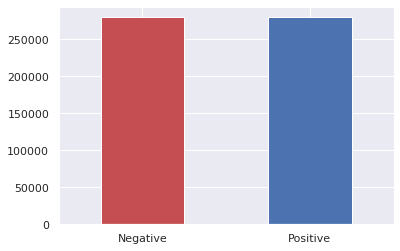

In [18]:
y_train.value_counts().sort_index().plot(kind='bar', color=['r', 'b']);
plt.xticks(rotation='horizontal');

In [19]:
y_test.nunique()

2

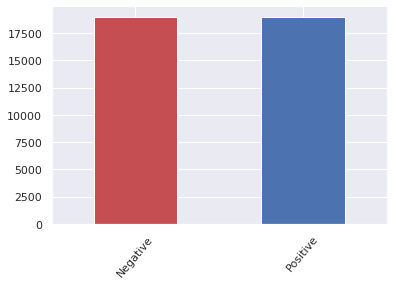

In [20]:
y_test.value_counts().sort_index().plot(kind='bar', color=['r', 'b']);
plt.xticks(rotation=50);

Os rótulos estão balanceados

### Analisando a quantidade de caracteres das sentenças:

In [21]:
x_train['len'] = x_train['text'].apply(len)
x_test['len'] = x_test['text'].apply(len)

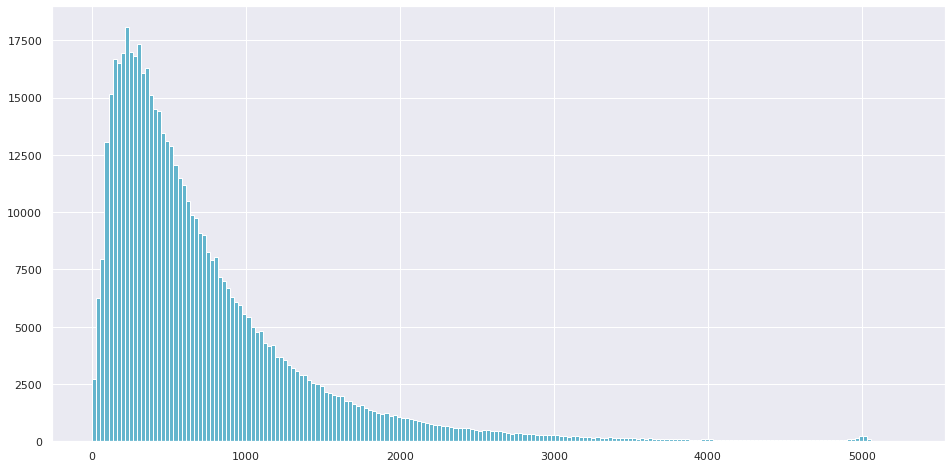

In [22]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

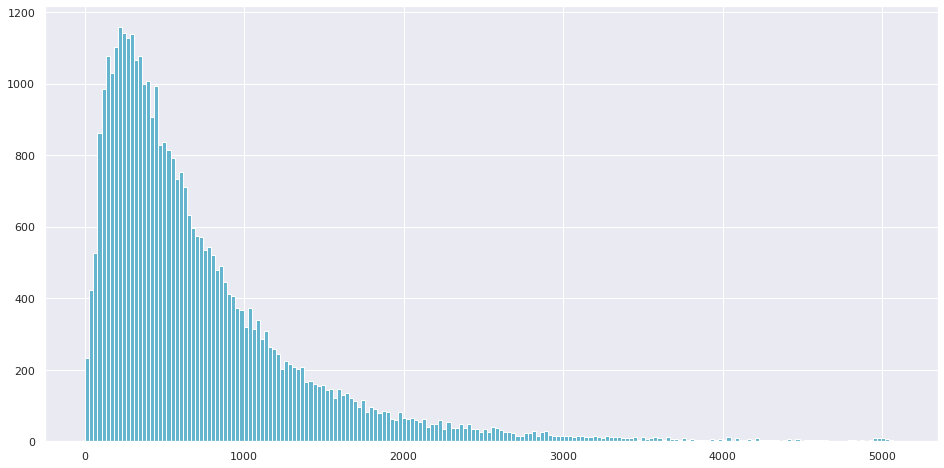

In [23]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

### Analisando a quantidade de palavras:

In [24]:
x_train['len'] = x_train['text'].apply(lambda x: len(x.split()))
x_test['len'] = x_test['text'].apply(lambda x: len(x.split()))

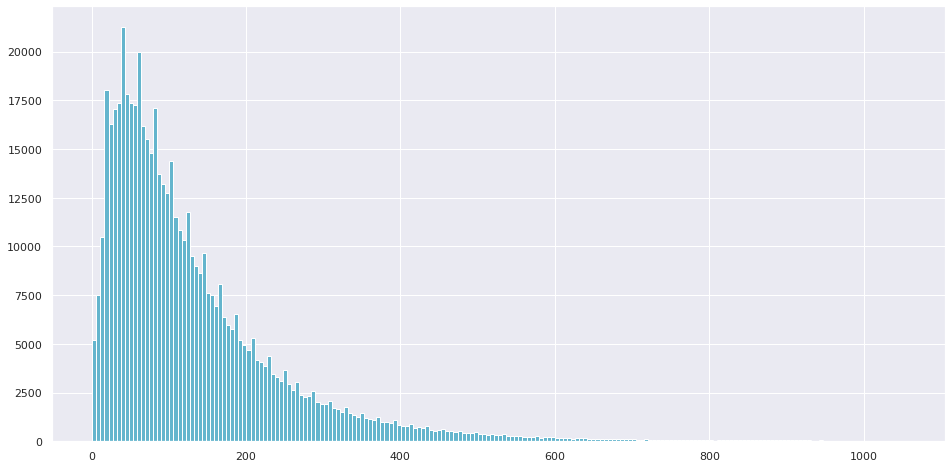

In [25]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

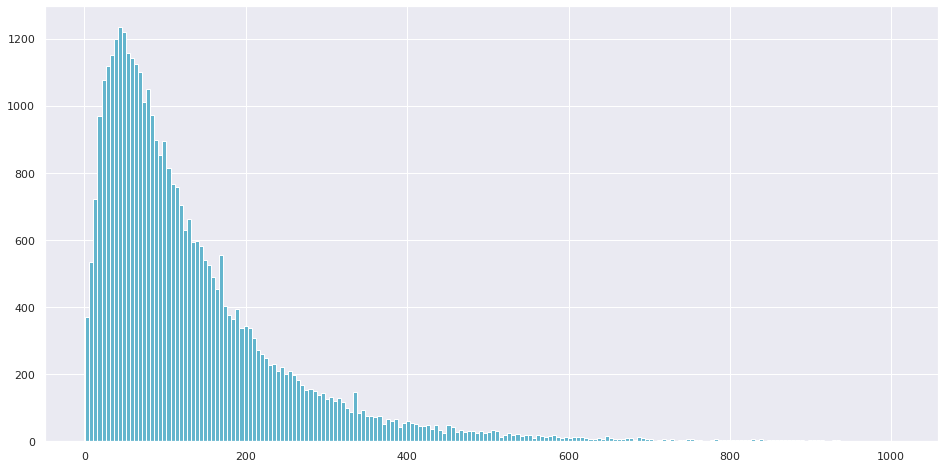

In [26]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

### Analisando a quantidade de palavras únicas:

In [27]:
x_train['len'] = x_train['text'].apply(lambda x: len(set(x.split())))
x_test['len'] = x_test['text'].apply(lambda x: len(set(x.split())))

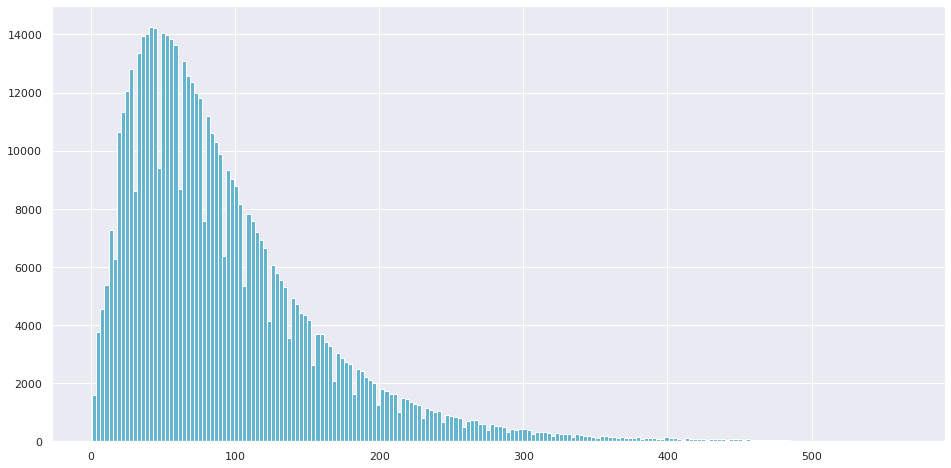

In [28]:
x_train['len'].hist(bins=200, figsize=(16, 8), color='c');

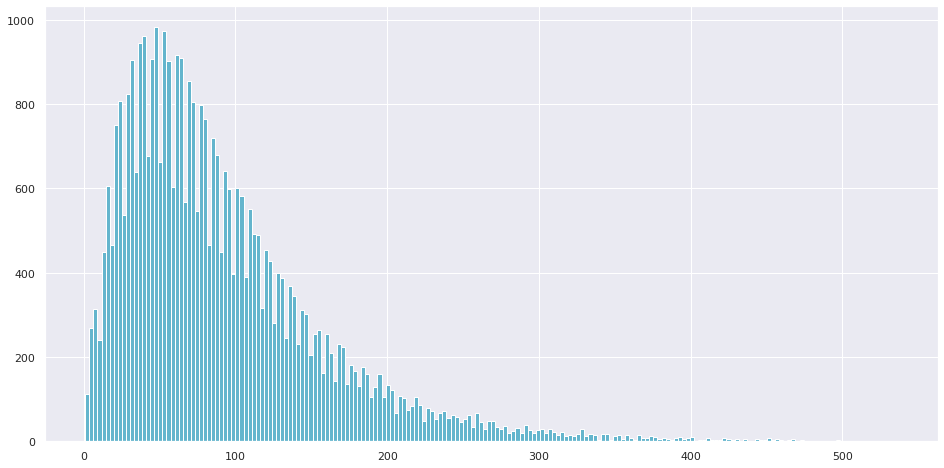

In [29]:
x_test['len'].hist(bins=200, figsize=(16, 8), color='c');

## Plotando as nuvens de palavras:

In [0]:
from wordcloud import WordCloud

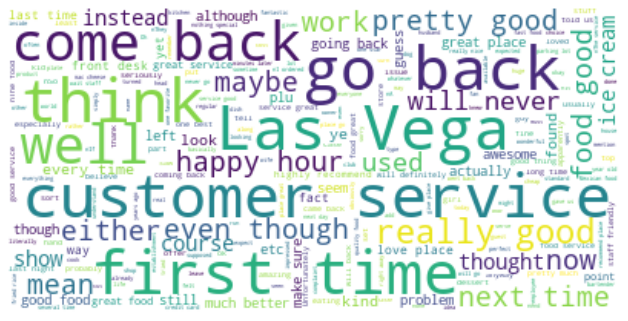

In [23]:
wordcloud = WordCloud(max_font_size=40, max_words=2000, relative_scaling=0, 
                      repeat=False, background_color="white")
wordcloud_geral = wordcloud.generate(' '.join(x_train['text']))

plt.figure(figsize=(11, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

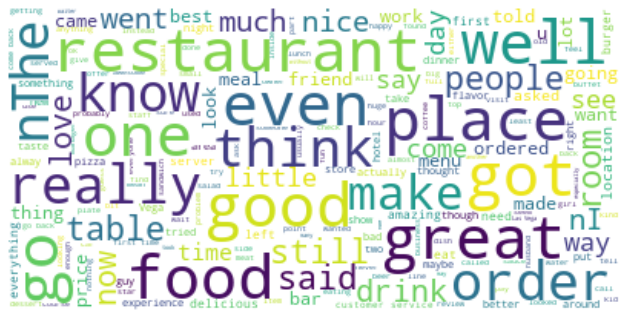

In [24]:
wordcloud = WordCloud(max_font_size=40, max_words=2000, relative_scaling=0, 
                      repeat=False, background_color="white")
wordcloud_geral = wordcloud.generate(' '.join(x_test['text']))

plt.figure(figsize=(11, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Modeling

In [30]:
vectorizer = TfidfVectorizer().fit(x_train['text'])

x_train = vectorizer.transform(x_train['text'])
x_test = vectorizer.transform(x_test['text'])

In [37]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_jobs=-1).fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.5180263157894737
precision: 0.5454336158111525
recall:    0.5180263157894737
f1_score:  0.4324315501639952


In [31]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.793921052631579
precision: 0.7939272153326672
recall:    0.793921052631579
f1_score:  0.7939199724240105


In [32]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_jobs=-1).fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.8925263157894737
precision: 0.893295038723888
recall:    0.8925263157894737
f1_score:  0.8924737738884042


In [38]:
from sklearn.ensemble import AdaBoostClassifier

model = AdaBoostClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.8441315789473685
precision: 0.8447473578922302
recall:    0.8441315789473685
f1_score:  0.8440619458027778


In [39]:
from sklearn.neural_network import MLPClassifier

model = MLPClassifier().fit(x_train, y_train)

y_pred = model.predict(x_test)
print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

accuracy:  0.9358947368421052
precision: 0.9358985234841265
recall:    0.9358947368421052
f1_score:  0.9358945976215084


In [ ]:
# from sklearn.svm import SVC

# model = SVC().fit(x_train, y_train)

# y_pred = model.predict(x_test)
# print(f'accuracy:  {accuracy_score(y_test, y_pred)}')
# print(f'precision: {precision_score(y_test, y_pred, average="weighted")}')
# print(f'recall:    {recall_score(y_test, y_pred, average="weighted")}')
# print(f'f1_score:  {f1_score(y_test, y_pred, average="weighted")}')

## Feature importance

In [33]:
mapping_features = {}
for i, feat in enumerate(vectorizer.get_feature_names()):
    mapping_features[i] = feat

In [34]:
x_train.shape[1]

224898

In [35]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_jobs=-1).fit(x_train, y_train)

In [36]:
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print(f"{f + 1}. {mapping_features[indices[f]]} ({importances[indices[f]]})")
    if importances[indices[f]] == 0.0:
        break

Feature ranking:
1. not (0.013015493936102313)
2. great (0.012089284728917035)
3. no (0.006199252505046735)
4. delicious (0.006186932811834542)
5. amazing (0.006135983999169233)
6. best (0.005673179201576194)
7. love (0.005341623917843831)
8. worst (0.005246078768230775)
9. was (0.0051979891353350445)
10. to (0.005043681321595853)
11. horrible (0.004980292838821866)
12. and (0.004889281128409442)
13. friendly (0.004689380348701743)
14. definitely (0.004143352502040661)
15. is (0.0040871371886396874)
16. terrible (0.004078928001525049)
17. awesome (0.003992525850016557)
18. good (0.0037278617991680354)
19. always (0.003639084803239173)
20. bad (0.0035277906578896237)
21. the (0.0034596002908391433)
22. favorite (0.0034096573987437806)
23. ok (0.003230486199750471)
24. rude (0.0032259035454634166)
25. told (0.00310425890210742)
26. perfect (0.0030850774702724385)
27. but (0.0030271061386936532)
28. excellent (0.0030227705851365435)
29. at (0.0029605141424358197)
30. said (0.0029540597918

2283. melt (5.336074127071316e-05)
2284. meatballs (5.335630334832999e-05)
2285. planet (5.335194117444139e-05)
2286. app (5.3293285127990005e-05)
2287. nervous (5.3289258286569925e-05)
2288. coast (5.327703162819075e-05)
2289. throwing (5.32693843505737e-05)
2290. fashion (5.3233636214970867e-05)
2291. bitter (5.3221914741688826e-05)
2292. signs (5.3194720717800984e-05)
2293. nightmare (5.319046961096318e-05)
2294. booths (5.3186218311980075e-05)
2295. nicest (5.317672430136866e-05)
2296. treatment (5.316204360216413e-05)
2297. beginning (5.3145614781487545e-05)
2298. joints (5.311012523898309e-05)
2299. includes (5.305504382138882e-05)
2300. improve (5.300199332674463e-05)
2301. photos (5.293680044815058e-05)
2302. ourselves (5.292416141259694e-05)
2303. package (5.289103212606411e-05)
2304. patty (5.287732018354986e-05)
2305. garage (5.287508573137359e-05)
2306. dressed (5.2867895313345875e-05)
2307. bagels (5.286348506159905e-05)
2308. museum (5.2858020515419564e-05)
2309. bags (5.

4129. cons (2.1050602194857165e-05)
4130. virtually (2.102254332527938e-05)
4131. radio (2.1015912331437212e-05)
4132. brie (2.1006084976907586e-05)
4133. sunny (2.1000788104277102e-05)
4134. sf (2.0994510868746106e-05)
4135. highest (2.093813516535022e-05)
4136. nparking (2.09344292980707e-05)
4137. culture (2.0927999054457477e-05)
4138. jalapenos (2.092400695634925e-05)
4139. barista (2.0917816623102825e-05)
4140. toys (2.0911675154233448e-05)
4141. pastas (2.0908144768933376e-05)
4142. aioli (2.0902914410030036e-05)
4143. fails (2.090291265878166e-05)
4144. hangout (2.090228886496531e-05)
4145. cave (2.088469056049836e-05)
4146. length (2.0883615741671615e-05)
4147. file (2.0876262899504255e-05)
4148. stingy (2.0865691262567553e-05)
4149. competitive (2.0860905454031502e-05)
4150. cuticles (2.0860149025382495e-05)
4151. sundae (2.0859932118377934e-05)
4152. lamp (2.083416490719732e-05)
4153. eatery (2.082474584351544e-05)
4154. routine (2.08241052452702e-05)
4155. colored (2.0821955

6367. candles (1.0002281775859927e-05)
6368. ann (1.0001376416678815e-05)
6369. preface (9.992010370026656e-06)
6370. monta (9.987486773069307e-06)
6371. mask (9.984534700896076e-06)
6372. cannoli (9.984165942790467e-06)
6373. hush (9.980467362048885e-06)
6374. consumer (9.979264623358467e-06)
6375. mandatory (9.97826219437925e-06)
6376. teller (9.971267764083982e-06)
6377. ndid (9.97064705913474e-06)
6378. colleague (9.970487457928968e-06)
6379. breaker (9.966981798483276e-06)
6380. oriental (9.9645674352452e-06)
6381. rabbit (9.959234764871601e-06)
6382. apologizing (9.958189115978442e-06)
6383. peruvian (9.954293389496952e-06)
6384. lion (9.95128411674652e-06)
6385. jerry (9.942176273961796e-06)
6386. grainy (9.935703915939176e-06)
6387. kiosk (9.933057589239465e-06)
6388. belgian (9.932088996428995e-06)
6389. plush (9.929714372970571e-06)
6390. forms (9.929597596113198e-06)
6391. nfree (9.925665986300227e-06)
6392. oldest (9.924872731834819e-06)
6393. bodies (9.922882064853798e-06)

8595. african (5.769574609025494e-06)
8596. miniature (5.768747557191266e-06)
8597. banquet (5.768269147269751e-06)
8598. enemy (5.7657694282554435e-06)
8599. mats (5.7649127981250616e-06)
8600. consultant (5.7636759431727075e-06)
8601. demographic (5.762597389816679e-06)
8602. groomers (5.760092768488417e-06)
8603. mistakenly (5.758582705485541e-06)
8604. korea (5.7570707476683685e-06)
8605. pire (5.753334270056077e-06)
8606. nspicy (5.752282343761223e-06)
8607. cages (5.750896899727096e-06)
8608. humanity (5.750492979320237e-06)
8609. maintaining (5.750492949427281e-06)
8610. shines (5.749668237209313e-06)
8611. agreement (5.749135215447099e-06)
8612. amanda (5.748819018395408e-06)
8613. lent (5.748141091654229e-06)
8614. accurately (5.745522073991499e-06)
8615. jets (5.744078663015032e-06)
8616. packaging (5.7420131262928724e-06)
8617. discovering (5.737965157984917e-06)
8618. announced (5.737890033490929e-06)
8619. xmas (5.734463666010181e-06)
8620. tore (5.731983791283008e-06)
862

10847. entrances (3.7567199618308545e-06)
10848. installer (3.756261056138386e-06)
10849. dealerships (3.756048895311196e-06)
10850. mum (3.7559239694270227e-06)
10851. furious (3.755346008598513e-06)
10852. navigating (3.7545954220873974e-06)
10853. optimistic (3.753956999756846e-06)
10854. gripes (3.7516359323142942e-06)
10855. chlorine (3.7509737453326206e-06)
10856. dinky (3.7507746197365478e-06)
10857. overbooked (3.7503636545322245e-06)
10858. waves (3.7498027785679765e-06)
10859. consumers (3.749399642399935e-06)
10860. methinks (3.749325456950032e-06)
10861. convincing (3.749088286236312e-06)
10862. sakana (3.7490505020741387e-06)
10863. bloomfield (3.7484692260017764e-06)
10864. beginners (3.748261927695051e-06)
10865. minnesota (3.7476434451993935e-06)
10866. pencil (3.7469070648359e-06)
10867. exchanged (3.746310614188296e-06)
10868. glimpse (3.745748905292219e-06)
10869. rollers (3.745090240457583e-06)
10870. misfortune (3.745062041894111e-06)
10871. surcharge (3.7448144871

13101. bridesmaid (2.643898630112226e-06)
13102. hardworking (2.6437042527085155e-06)
13103. adjusting (2.6436350510809964e-06)
13104. locating (2.6433829996458396e-06)
13105. summarize (2.6433275033987383e-06)
13106. overdressed (2.6430614896788326e-06)
13107. shibuya (2.642302446382566e-06)
13108. gg (2.6420168771754874e-06)
13109. samantha (2.641965928763024e-06)
13110. weirdos (2.641596361649867e-06)
13111. inhaling (2.6408020023458423e-06)
13112. emotions (2.640788903676334e-06)
13113. douse (2.6400448749997577e-06)
13114. tix4tonight (2.6397028581633434e-06)
13115. breezy (2.638098986972917e-06)
13116. u00e4 (2.636789062155553e-06)
13117. routines (2.6357435538532264e-06)
13118. nordstroms (2.6357100602172297e-06)
13119. lurking (2.6354197978490132e-06)
13120. brule (2.635395303463163e-06)
13121. showering (2.634519433586009e-06)
13122. slabs (2.6344686518452476e-06)
13123. sponsored (2.6344270797956767e-06)
13124. ensuring (2.6341740042336022e-06)
13125. rejects (2.6340283553695

15328. preceded (1.9512114711912277e-06)
15329. guidelines (1.9503735465994367e-06)
15330. bev (1.9502597817225546e-06)
15331. bu (1.9495181197532456e-06)
15332. kroger (1.9494418415271204e-06)
15333. snazzy (1.949231498524613e-06)
15334. revealing (1.948921728044275e-06)
15335. nwings (1.948269103795428e-06)
15336. complications (1.948214326793129e-06)
15337. boobies (1.948182540987666e-06)
15338. carlton (1.9481199465658034e-06)
15339. mullet (1.9478762509849164e-06)
15340. dale (1.9474959617347325e-06)
15341. slutty (1.947149598639083e-06)
15342. definatly (1.946871944477282e-06)
15343. saggy (1.946577257675411e-06)
15344. goats (1.9461555167506005e-06)
15345. usher (1.9461535408515545e-06)
15346. nsitting (1.9461223644864406e-06)
15347. reallly (1.9461124925951854e-06)
15348. esplanade (1.945793629287289e-06)
15349. bechamel (1.945537542703615e-06)
15350. booster (1.9453470144400077e-06)
15351. emotionally (1.9451841233749e-06)
15352. u00fcrde (1.9434655481694223e-06)
15353. penis 

17559. brianna (1.5007167925150716e-06)
17560. tripped (1.500566015855431e-06)
17561. carafes (1.5002572881358176e-06)
17562. silicone (1.5002536830515804e-06)
17563. polynesian (1.500062125395657e-06)
17564. winery (1.4999690023054897e-06)
17565. glop (1.4996911717418948e-06)
17566. chewable (1.4996779189751678e-06)
17567. nrice (1.4996306868041622e-06)
17568. 6p (1.499541887842975e-06)
17569. mangled (1.499332032169964e-06)
17570. baggie (1.4990711773055897e-06)
17571. axis (1.4987872121908062e-06)
17572. tiring (1.498490406751552e-06)
17573. colombian (1.4981495143829088e-06)
17574. abandon (1.4979471872958577e-06)
17575. asylum (1.4978566847107941e-06)
17576. 1k (1.4974854196484963e-06)
17577. distress (1.4972892603553962e-06)
17578. educating (1.4971892440600542e-06)
17579. retirees (1.4966029004084591e-06)
17580. exploration (1.4964549897575019e-06)
17581. hazaaaaaaaaaaaard (1.49636764747022e-06)
17582. whale (1.4960610796818542e-06)
17583. mangoes (1.4960204242541634e-06)
17584.

19934. efficace (1.1633206564463105e-06)
19935. pant (1.1632730276952718e-06)
19936. cabbies (1.1632582460545416e-06)
19937. microwavable (1.163040998307632e-06)
19938. u00eener (1.1630028311131756e-06)
19939. roasters (1.1629398460377559e-06)
19940. lieblos (1.1627398437413318e-06)
19941. cheapened (1.1626401480208902e-06)
19942. imply (1.1626329879849274e-06)
19943. hatten (1.1626217620885953e-06)
19944. indefinitely (1.1626159149743276e-06)
19945. fasting (1.1623584836955434e-06)
19946. malfunction (1.1623140372985874e-06)
19947. stabbing (1.1622456674549637e-06)
19948. superman (1.1620244212411238e-06)
19949. shortrib (1.161978517067519e-06)
19950. breeding (1.1618940639505804e-06)
19951. retainer (1.1618879676801684e-06)
19952. mp (1.1616879135913829e-06)
19953. reptile (1.1616749818089377e-06)
19954. nonion (1.1616133068007638e-06)
19955. bullying (1.1615074551368505e-06)
19956. intricacies (1.1615064547355043e-06)
19957. undecided (1.1612077887258167e-06)
19958. groped (1.161125

22002. blowingly (9.590642177316052e-07)
22003. hubbard (9.590443122143337e-07)
22004. ncrust (9.58772244828167e-07)
22005. suiza (9.58614086214624e-07)
22006. teambuy (9.586036015084119e-07)
22007. unrefrigerated (9.58494910062517e-07)
22008. blazer (9.584835808143635e-07)
22009. nfinished (9.583771720956215e-07)
22010. sharable (9.582851020145336e-07)
22011. hounds (9.58105580872064e-07)
22012. foreseeable (9.577699151641442e-07)
22013. anchors (9.577243010398077e-07)
22014. ponder (9.576510465173322e-07)
22015. shuseki (9.575926365814057e-07)
22016. pernil (9.575761195625705e-07)
22017. simplemente (9.575228891450924e-07)
22018. inbox (9.574835971806853e-07)
22019. thug (9.574512171419705e-07)
22020. reciept (9.5744324326329e-07)
22021. slum (9.573140820892213e-07)
22022. bowie (9.57307556412862e-07)
22023. garfield (9.57142340948772e-07)
22024. minding (9.570933931102413e-07)
22025. moes (9.570587942868756e-07)
22026. drinkin (9.569237179633272e-07)
22027. brocoli (9.56885232671912

24267. 930am (7.856519754981795e-07)
24268. raisonnables (7.855904835457688e-07)
24269. bunched (7.855817095199343e-07)
24270. invasive (7.855152175315473e-07)
24271. gusta (7.854749806273145e-07)
24272. tortaco (7.854450190606215e-07)
24273. unnoticeable (7.852593016188967e-07)
24274. taouk (7.851960964836424e-07)
24275. 235 (7.851942292057857e-07)
24276. rumored (7.850789947475708e-07)
24277. sherri (7.850106982052744e-07)
24278. ong (7.849354696802858e-07)
24279. energized (7.848887626511335e-07)
24280. michele (7.848534367043516e-07)
24281. bentley (7.848428763703223e-07)
24282. spawn (7.848156027565037e-07)
24283. lacey (7.846549921135632e-07)
24284. offline (7.845917638636581e-07)
24285. mikey (7.845852616519748e-07)
24286. saimen (7.845818135337906e-07)
24287. winchells (7.845568242568572e-07)
24288. charities (7.84528669254408e-07)
24289. yinzers (7.845235077074091e-07)
24290. unmanned (7.843965713691031e-07)
24291. journeyed (7.843277560320991e-07)
24292. abq (7.84217106255166

26575. careers (6.552784656919457e-07)
26576. vivant (6.552782646442176e-07)
26577. tostado (6.552688999689875e-07)
26578. epoxy (6.551843684473649e-07)
26579. gunsmith (6.551271928246405e-07)
26580. strengthen (6.551107949627295e-07)
26581. townhouse (6.551082643079846e-07)
26582. hmo (6.550901745646085e-07)
26583. wissen (6.550899152157056e-07)
26584. wooed (6.550830347115986e-07)
26585. verse (6.550664659164585e-07)
26586. 5lbs (6.550544384553324e-07)
26587. valentina (6.549137737850069e-07)
26588. picado (6.549060991670073e-07)
26589. dsl (6.548319424477337e-07)
26590. frigo (6.548258698365524e-07)
26591. 1930 (6.548202046381205e-07)
26592. chippers (6.547970428738147e-07)
26593. glacial (6.547575486215602e-07)
26594. segments (6.547200311060474e-07)
26595. rasta (6.546957563663041e-07)
26596. experiments (6.546594568488984e-07)
26597. churns (6.546483522643746e-07)
26598. barebones (6.546464593282431e-07)
26599. allegro (6.546309023362176e-07)
26600. delaying (6.546228792478262e-0

28790. tonopah (5.580990609885253e-07)
28791. shlep (5.580929928110366e-07)
28792. bonbons (5.580602525899313e-07)
28793. faibles (5.580003097338384e-07)
28794. doro (5.579892318488127e-07)
28795. dory (5.579362548531654e-07)
28796. sprained (5.578748120192107e-07)
28797. ehhhhhh (5.578665013673974e-07)
28798. corals (5.577635026404089e-07)
28799. calamaris (5.577488810108504e-07)
28800. ganouj (5.577258904327653e-07)
28801. bipolar (5.576887503078928e-07)
28802. fuentes (5.57662588816772e-07)
28803. whiski (5.575915402276425e-07)
28804. hemingway (5.575747378518992e-07)
28805. avx (5.575491769217239e-07)
28806. mornay (5.574425479988609e-07)
28807. crolla (5.573729111121763e-07)
28808. bauer (5.57312114670182e-07)
28809. bck (5.57269624048247e-07)
28810. pumice (5.572176135260892e-07)
28811. whoppers (5.571456080504168e-07)
28812. bested (5.571176727478527e-07)
28813. fundio (5.571171740722804e-07)
28814. summarizes (5.570028992745852e-07)
28815. blushing (5.569509355772682e-07)
28816

30981. hayes (4.816806701039871e-07)
30982. reassurance (4.816495128895035e-07)
30983. nsmooches (4.816336084569722e-07)
30984. cheapish (4.816010054026239e-07)
30985. rivioli (4.815375919808964e-07)
30986. steed (4.814598215670867e-07)
30987. karahi (4.814581538158309e-07)
30988. onigiri (4.814207036637863e-07)
30989. 4yrs (4.814080191566999e-07)
30990. inferred (4.813924746747402e-07)
30991. vaginas (4.813916626916263e-07)
30992. meena (4.813810895759834e-07)
30993. chugged (4.813791522814783e-07)
30994. minions (4.813693656057597e-07)
30995. peuvent (4.813622768634394e-07)
30996. arlin (4.813594076933143e-07)
30997. tirimisu (4.813214001974823e-07)
30998. mendota (4.812440364923118e-07)
30999. 1982 (4.812436106568846e-07)
31000. plante (4.812240301363714e-07)
31001. propositioned (4.811910432962332e-07)
31002. sunburn (4.811840018088159e-07)
31003. druggie (4.81163884340874e-07)
31004. gw (4.811500649122408e-07)
31005. centropolis (4.811175102696888e-07)
31006. marinaded (4.81110249

33392. nfr (4.160929909862887e-07)
33393. nborsch (4.16087064192146e-07)
33394. calamri (4.160693117968456e-07)
33395. conniver (4.1600101035758875e-07)
33396. 311 (4.159978840688379e-07)
33397. transformers (4.1597453476806234e-07)
33398. burguer (4.159690383649499e-07)
33399. 01am (4.1593022361738925e-07)
33400. racy (4.1591478549291925e-07)
33401. nfilled (4.159137910240571e-07)
33402. bacterial (4.1589413040229316e-07)
33403. accomplishing (4.1580640871290635e-07)
33404. nalternatively (4.1578995247124046e-07)
33405. pare (4.157545870002634e-07)
33406. pitaya (4.1575454878537946e-07)
33407. newlyweds (4.157062629208512e-07)
33408. gifting (4.1570061226167055e-07)
33409. gizzard (4.1568129875644613e-07)
33410. proportionate (4.156537655875029e-07)
33411. gussied (4.1563695244467217e-07)
33412. grump (4.155896728041305e-07)
33413. queries (4.155761664019247e-07)
33414. sitdown (4.1555570754734405e-07)
33415. extravagance (4.1555324511996343e-07)
33416. maragaritas (4.1554205339649285

35645. communicator (3.66329666890843e-07)
35646. firstworldproblems (3.663018212675824e-07)
35647. stimulated (3.6629948307395076e-07)
35648. hightailed (3.662867104315283e-07)
35649. karawi (3.6627878068140597e-07)
35650. sani (3.6626198279311537e-07)
35651. maiko (3.6623984777837437e-07)
35652. beanie (3.661884315871233e-07)
35653. luce (3.6618389565717454e-07)
35654. babyback (3.6614732444187947e-07)
35655. curtained (3.661091446109883e-07)
35656. ughhhhhh (3.660805863954117e-07)
35657. morphs (3.6608018446614387e-07)
35658. banane (3.660670592516993e-07)
35659. gringoized (3.6604616000103885e-07)
35660. huaraches (3.660414732102577e-07)
35661. phene (3.6603882161253783e-07)
35662. leckeres (3.660244099606247e-07)
35663. geeking (3.6596633501793225e-07)
35664. modalities (3.659535661861818e-07)
35665. hindered (3.6593051379320184e-07)
35666. afoot (3.658932933553167e-07)
35667. shud (3.658841970292089e-07)
35668. motorworks (3.6586625313663774e-07)
35669. juxtaposition (3.658162824

37894. ishi (3.255822430142449e-07)
37895. 181 (3.2557676423156636e-07)
37896. pendy (3.2557266000735043e-07)
37897. hearst (3.2556886400384784e-07)
37898. yusho (3.2553597795592275e-07)
37899. centerfolds (3.25519997620243e-07)
37900. keelah (3.255048050355264e-07)
37901. drinky (3.2547819849825173e-07)
37902. whined (3.2544720269085866e-07)
37903. somelier (3.254182436232999e-07)
37904. moca (3.2540332975637453e-07)
37905. getta (3.254007786133661e-07)
37906. nfusion (3.2535845018925187e-07)
37907. receptions (3.25316629940531e-07)
37908. recorders (3.253056839375069e-07)
37909. cranial (3.2527017432281706e-07)
37910. peeping (3.252585443609394e-07)
37911. klutz (3.2521254582305763e-07)
37912. rapture (3.2520887385453165e-07)
37913. tasti (3.251741973541572e-07)
37914. cheeseless (3.251585314864004e-07)
37915. u00e9penser (3.2512792094968617e-07)
37916. cappy (3.251207505094912e-07)
37917. compacts (3.2510570720307697e-07)
37918. goths (3.25105029869281e-07)
37919. oberon (3.25102515

40135. kinna (2.9252290439528585e-07)
40136. komp (2.9251658248518435e-07)
40137. andalusian (2.925072800184885e-07)
40138. tobias (2.9250332040687723e-07)
40139. jura (2.92502482929665e-07)
40140. waipahu (2.9249285127112986e-07)
40141. nginger (2.924736260088063e-07)
40142. loooooove (2.924606421695524e-07)
40143. magpie (2.924510082077232e-07)
40144. zoeskitchen (2.9243978000454125e-07)
40145. tait (2.923926167024726e-07)
40146. presqu (2.923919831920976e-07)
40147. footer (2.923813890874332e-07)
40148. 4r (2.923794780092772e-07)
40149. ninitial (2.9235996543836225e-07)
40150. ballyhooed (2.9235969207750044e-07)
40151. bastardizing (2.9234400565470443e-07)
40152. fistfuls (2.9234019681923905e-07)
40153. tchy (2.923067324301979e-07)
40154. deluded (2.923063447494819e-07)
40155. thevegasevent (2.9229144148048803e-07)
40156. bombolini (2.9227189328229363e-07)
40157. paquita (2.922498078643758e-07)
40158. pullulent (2.92241767095833e-07)
40159. peddlers (2.922345195956299e-07)
40160. np

42444. emphatic (2.635020717793228e-07)
42445. defected (2.634904039355404e-07)
42446. electriques (2.6348129913445735e-07)
42447. suneel (2.6346453808510294e-07)
42448. nlengua (2.6346062101930635e-07)
42449. lafond (2.634449321873853e-07)
42450. aeas (2.6342697492264435e-07)
42451. fazolis (2.634099747982304e-07)
42452. 06am (2.634090119963134e-07)
42453. npadoom (2.633971333297678e-07)
42454. mittens (2.6339637597695094e-07)
42455. brosse (2.6339633826853675e-07)
42456. seaters (2.6339608151059995e-07)
42457. akropolis (2.6339432977563766e-07)
42458. hipsterness (2.633738849596118e-07)
42459. haunting (2.6336624227770423e-07)
42460. emp (2.633587305369808e-07)
42461. hydrocodone (2.6334709561384386e-07)
42462. worryingly (2.6332895624248625e-07)
42463. nodd (2.633271393618591e-07)
42464. snackbox (2.6332074932225424e-07)
42465. potatocakes (2.6331212122469387e-07)
42466. botcher (2.632931590816446e-07)
42467. u00e4rgert (2.632910054206871e-07)
42468. freakfest (2.632865637322834e-07

44747. hotelred (2.3968973004737564e-07)
44748. beheld (2.39689127486718e-07)
44749. rations (2.3968758479209743e-07)
44750. berliner (2.396875166073629e-07)
44751. habenaro (2.396871115648838e-07)
44752. 430pm (2.3967894718455226e-07)
44753. freakling (2.3967703533310257e-07)
44754. siumai (2.3966797057307456e-07)
44755. caos (2.396582029517576e-07)
44756. cy (2.3964116513617837e-07)
44757. disturbs (2.3962912346530424e-07)
44758. 193 (2.3962201674721655e-07)
44759. u6700 (2.396167095054824e-07)
44760. greekfest (2.395980431878174e-07)
44761. seront (2.3958929910311894e-07)
44762. recomed (2.395743300927353e-07)
44763. nai (2.3957038893117037e-07)
44764. sinteriordesign (2.395535867640686e-07)
44765. sicillian (2.395235922182273e-07)
44766. yvr (2.395010538700055e-07)
44767. skippy (2.3949314746567083e-07)
44768. loction (2.394769665840616e-07)
44769. butterjoint (2.3947604975300995e-07)
44770. unleashing (2.39447058191306e-07)
44771. overspilling (2.3943812123694565e-07)
44772. jugge

46885. ntender (2.200171857175593e-07)
46886. insolite (2.2001054037931538e-07)
46887. u00fcgung (2.2000749180305132e-07)
46888. poundstretcher (2.2000020514142643e-07)
46889. scholars (2.1997998415559665e-07)
46890. soooeeee (2.199604145582288e-07)
46891. altercations (2.199541191334955e-07)
46892. studenty (2.199403594689348e-07)
46893. ticktets (2.199323954316361e-07)
46894. nosedive (2.1992965508631645e-07)
46895. gaaah (2.1992916216157647e-07)
46896. klavon (2.1992321422057197e-07)
46897. snottiest (2.1991835298500334e-07)
46898. nbreak (2.1990535000501677e-07)
46899. chainsmokes (2.1990348098040308e-07)
46900. metropark (2.198942637335196e-07)
46901. steerage (2.1989247686637082e-07)
46902. bitttyyy (2.1989183835645554e-07)
46903. bengning (2.1988259666026544e-07)
46904. folger (2.1988100902459388e-07)
46905. pitied (2.1988024458372174e-07)
46906. whst (2.1987958169682107e-07)
46907. endlich (2.198643487584457e-07)
46908. scribble (2.198640876962909e-07)
46909. chciken (2.1985290

49267. watter (2.010746684073364e-07)
49268. turrets (2.0107145587632197e-07)
49269. manong (2.0105433732407012e-07)
49270. quivey (2.0105201517391682e-07)
49271. sesque (2.0105181311371208e-07)
49272. brenton (2.0104920321805816e-07)
49273. karsh (2.0103726786872175e-07)
49274. trilled (2.010289912000936e-07)
49275. nhawaii (2.010253172727905e-07)
49276. apeal (2.010126013308207e-07)
49277. kisras (2.0101157663477694e-07)
49278. slugged (2.0100986698156046e-07)
49279. u3002 (2.009766558112113e-07)
49280. pretip (2.009746588556208e-07)
49281. mashers (2.0097257947935732e-07)
49282. ruban (2.009685899391898e-07)
49283. hoarding (2.0096031141721927e-07)
49284. ngyoza (2.009448393558218e-07)
49285. entrails (2.009407549478201e-07)
49286. hopung (2.009393436913632e-07)
49287. reluctance (2.0093531535009113e-07)
49288. fuhdangah (2.009338050450997e-07)
49289. crudeness (2.009335413975954e-07)
49290. paix (2.0092641985104298e-07)
49291. yorrgrx9pds_3uj (2.0091287445072663e-07)
49292. getup (

51601. insurmountable (1.848011932600675e-07)
51602. comrades (1.8478674157820027e-07)
51603. importants (1.847764221814444e-07)
51604. goldberg (1.8476538785382936e-07)
51605. snuggie (1.8476055403268114e-07)
51606. simonmed (1.8475711251999975e-07)
51607. rehydrate (1.8475639534098634e-07)
51608. holleywood (1.8475325654162877e-07)
51609. nikea (1.8475320361841013e-07)
51610. marooney (1.847502044388709e-07)
51611. cashman (1.8474979231057116e-07)
51612. sadu (1.8474010641744906e-07)
51613. xile (1.847263701549551e-07)
51614. fishcake (1.8472241807505018e-07)
51615. giamatti (1.8472046500711446e-07)
51616. glutenfree (1.8471795721388374e-07)
51617. colcolate (1.8471683817635188e-07)
51618. nostalgie (1.8471611680762177e-07)
51619. eclaires (1.8471607645940905e-07)
51620. ausstattung (1.8471559513425894e-07)
51621. puple (1.8471450965856877e-07)
51622. resellers (1.84713788661786e-07)
51623. davio (1.8470811308076504e-07)
51624. towncenter (1.8469084638304552e-07)
51625. rumblings (1.

53870. extricate (1.7056341751621258e-07)
53871. polpette (1.7056301768992877e-07)
53872. speacial (1.7054786853525306e-07)
53873. hammon (1.7053449569009763e-07)
53874. pounce (1.7052940948129294e-07)
53875. borat (1.705120105547168e-07)
53876. u00e9rique (1.705099541514002e-07)
53877. creditors (1.704980705150826e-07)
53878. cardinale (1.7049674284883365e-07)
53879. taym (1.7049235782997814e-07)
53880. fla (1.7049035782535045e-07)
53881. chritophers (1.7049010340726182e-07)
53882. nvacancies (1.7048199354033918e-07)
53883. surpisingly (1.7046935513860506e-07)
53884. jakarta (1.7046669987205193e-07)
53885. combinaison (1.7045287751284833e-07)
53886. njalape (1.7045156007484438e-07)
53887. decription (1.7043664226620806e-07)
53888. cinn (1.7043222013661194e-07)
53889. emril (1.7042885576863748e-07)
53890. 1000000x (1.7040380641601407e-07)
53891. bungelow (1.7040031138003132e-07)
53892. uff1f (1.7039495619865197e-07)
53893. dogy (1.703923225604392e-07)
53894. hessian (1.7039229262951182

55936. npb (1.59159664287553e-07)
55937. but4 (1.5915003129216432e-07)
55938. pyrimid (1.5914929815076256e-07)
55939. renig (1.5913372490972967e-07)
55940. roig (1.5911421924428116e-07)
55941. diverting (1.5911200687128212e-07)
55942. budging (1.5910530891995828e-07)
55943. youngman (1.590965743793773e-07)
55944. blondeish (1.5909443775891739e-07)
55945. unentertaining (1.5908520500372705e-07)
55946. okobi (1.5907347597319865e-07)
55947. wohngebiet (1.5907160500157718e-07)
55948. nreturns (1.590634918270608e-07)
55949. eggscellent (1.5906260459745248e-07)
55950. offroad (1.590602091834064e-07)
55951. nneutral (1.5905927755831499e-07)
55952. foir (1.590497883839913e-07)
55953. alky (1.5904815378009112e-07)
55954. maaan (1.5904775547975194e-07)
55955. fanastic (1.590447735432141e-07)
55956. depite (1.590303195094508e-07)
55957. nhatch (1.5902229806450585e-07)
55958. 200ft (1.590222589090574e-07)
55959. maxvegas (1.5902143661177267e-07)
55960. wahsun (1.5901486667612024e-07)
55961. votive

58219. samedis (1.467276993525831e-07)
58220. sechuan (1.4672760968213313e-07)
58221. ravages (1.4671435300879978e-07)
58222. 8l (1.4670731774418076e-07)
58223. bestuhlung (1.467059767832613e-07)
58224. ndebated (1.4669641123974965e-07)
58225. normality (1.4669366406608422e-07)
58226. botchi (1.4668824948560671e-07)
58227. zuae6zaxviegnkkmwbjogw (1.466812672439423e-07)
58228. finalist (1.4667488938300093e-07)
58229. souveniers (1.4666951014275266e-07)
58230. luckyman (1.4666595833396575e-07)
58231. gambaholic (1.4666584032007263e-07)
58232. 461 (1.466519130196424e-07)
58233. sphincters (1.4664344880739708e-07)
58234. ndel (1.4664253535417069e-07)
58235. toughie (1.4663302302564246e-07)
58236. dispence (1.4662774150769143e-07)
58237. lthe (1.4661968987572021e-07)
58238. viniagrette (1.4661764571258352e-07)
58239. beaubien (1.466169721211439e-07)
58240. connaissais (1.4661173153630322e-07)
58241. cheezits (1.466064716574698e-07)
58242. entrepeneur (1.466063842727913e-07)
58243. cucos (1.

60582. fishouse (1.3542123090353914e-07)
60583. winebar (1.354157811382255e-07)
60584. nohhhh (1.354147371240162e-07)
60585. vfw (1.354124041548942e-07)
60586. quint (1.3540770669760398e-07)
60587. jeera (1.3539882924458523e-07)
60588. ambridge (1.3539867225330878e-07)
60589. nheels (1.3539180788665248e-07)
60590. purcells (1.3538959558353842e-07)
60591. herrscht (1.353840235165076e-07)
60592. fanilows (1.3538016509394175e-07)
60593. enlever (1.3537789532031083e-07)
60594. dofu (1.353771241978089e-07)
60595. blimpy (1.35373540665617e-07)
60596. njacked (1.3536518537512832e-07)
60597. brion (1.353650333932296e-07)
60598. herbes (1.3536350645231427e-07)
60599. jockeying (1.3536141898942943e-07)
60600. wynd (1.353590353260523e-07)
60601. insomniacs (1.353567910429147e-07)
60602. maresco (1.353540040107581e-07)
60603. mccaffery (1.3534051925304926e-07)
60604. zb (1.3533597384177327e-07)
60605. sabrett (1.3533133747689118e-07)
60606. thaifoodaficionado (1.3531928211223045e-07)
60607. sripra

62894. ndiscontinue (1.2627176982946172e-07)
62895. ongos (1.2626448020083373e-07)
62896. republics (1.262603501151499e-07)
62897. sevices (1.2625782904257757e-07)
62898. ncelebrity (1.2625380611112087e-07)
62899. kinki (1.262485024272196e-07)
62900. crispelle (1.2624396188005452e-07)
62901. u00e9licitation (1.2623666399945964e-07)
62902. tolerances (1.262361825950984e-07)
62903. ahhhhhhhh (1.2623184294129702e-07)
62904. succulente (1.2623166358734298e-07)
62905. angesprochen (1.26226256095187e-07)
62906. kien (1.2622544582212415e-07)
62907. retracts (1.2622225332975024e-07)
62908. lochs (1.2622104769763663e-07)
62909. belligerently (1.262118169303103e-07)
62910. laidon (1.2621179385176938e-07)
62911. heartened (1.2621174536023413e-07)
62912. nwontons (1.2621134243502867e-07)
62913. marisela (1.2621112148121925e-07)
62914. chinaman (1.2620617115422514e-07)
62915. 6850 (1.2620479036070302e-07)
62916. u00c9dimbourg (1.2620417150938335e-07)
62917. ramping (1.2620288490217488e-07)
62918. f

65177. beratungsqualit (1.1878081637371909e-07)
65178. ntn (1.1876886175547735e-07)
65179. repurchased (1.1876678344778846e-07)
65180. 85degrees (1.1876356434402431e-07)
65181. farmfoods (1.1876038265010641e-07)
65182. whooop (1.1875986332963998e-07)
65183. here__________ (1.1875896185590097e-07)
65184. dececco (1.1875779085559866e-07)
65185. lierally (1.1875449325357973e-07)
65186. sez (1.1875319846319808e-07)
65187. waterdeep (1.1874971892030831e-07)
65188. sekai (1.1874949034249733e-07)
65189. snidely (1.1874866187973792e-07)
65190. viettown (1.1874724109160718e-07)
65191. fbv (1.187350739444037e-07)
65192. groundskeeping (1.1873191773970159e-07)
65193. spanglish (1.1872655060167263e-07)
65194. leavened (1.1871995685164821e-07)
65195. engulfing (1.187179684442431e-07)
65196. rupe (1.187125557337655e-07)
65197. survivalist (1.187113626173845e-07)
65198. nconveinent (1.1870673220172211e-07)
65199. unpatronizing (1.1870574661033185e-07)
65200. servicios (1.1870444000252134e-07)
65201. 

67537. codfish (1.1170229392992229e-07)
67538. fuifilling (1.1166847289149983e-07)
67539. freindely (1.1166820783402153e-07)
67540. awwwwwfuuulllllyy (1.1165232911192622e-07)
67541. hengrenade (1.1165104300476437e-07)
67542. aufgefallen (1.116504759006042e-07)
67543. bryon (1.1164488583713411e-07)
67544. thiers (1.116438717921468e-07)
67545. stillnjad (1.1164280414548804e-07)
67546. signent (1.1163942718070186e-07)
67547. nkeefer (1.1163561134439301e-07)
67548. ndunkin (1.1162797995446263e-07)
67549. 0star (1.1162553328728092e-07)
67550. norco (1.1162305036950611e-07)
67551. schleier (1.1161958711309809e-07)
67552. cheapies (1.1161884512739096e-07)
67553. ntrip (1.1161838438633481e-07)
67554. preparty (1.1161706598608169e-07)
67555. stirfried (1.116161328998916e-07)
67556. cushionless (1.1161516574934106e-07)
67557. dwr (1.1161513913615737e-07)
67558. gamberoni (1.1161323113567493e-07)
67559. gwar (1.1161010191725787e-07)
67560. leistungs (1.1160472380818769e-07)
67561. wowwi (1.116018

69864. kegging (1.0470132295544642e-07)
69865. anythinh (1.0470028972281066e-07)
69866. recive (1.0469636418128601e-07)
69867. ungreatful (1.0469400274026162e-07)
69868. impoli (1.04692689859062e-07)
69869. coverd (1.046919079606348e-07)
69870. transsexual (1.046910135623907e-07)
69871. kas0mjmbb2 (1.0468053746261456e-07)
69872. tchiest (1.0468048179492695e-07)
69873. wali (1.0468046842821928e-07)
69874. mcmullans (1.0466791432330447e-07)
69875. nagedashi (1.0466710229260778e-07)
69876. reseeded (1.0466651196882847e-07)
69877. futility (1.0466058890262798e-07)
69878. suiteable (1.0465943847807026e-07)
69879. nhuarache (1.0465562583066102e-07)
69880. jabo (1.046536716009815e-07)
69881. caffeination (1.0464663911863488e-07)
69882. eal (1.0464283835991821e-07)
69883. neighor (1.0464221498073885e-07)
69884. ppvs (1.0463791349958607e-07)
69885. tailgated (1.046347829969756e-07)
69886. complaint_form_2006 (1.0463429889628314e-07)
69887. keyhole (1.0463303905453494e-07)
69888. manouri (1.0463

72064. restrants (9.76953233601511e-08)
72065. faccocia (9.769068450358756e-08)
72066. nfritters (9.768354263754966e-08)
72067. kabli (9.768294530831564e-08)
72068. wgat (9.76811759961423e-08)
72069. ducklings (9.767111713120871e-08)
72070. freeplay (9.76700501218345e-08)
72071. everyoneeeeeeeeeeeeeeeeee (9.766410572103699e-08)
72072. dirtyscottsdale (9.766299464416614e-08)
72073. vfc (9.76592065528749e-08)
72074. h2eau (9.765833035239947e-08)
72075. besuches (9.765743992498166e-08)
72076. u00b4s (9.76542143310266e-08)
72077. u00e9cadent (9.7647159298888e-08)
72078. heatlamps (9.764682254734941e-08)
72079. cushi (9.764304621185487e-08)
72080. grrrrroooooosss (9.763727471624668e-08)
72081. 13yo (9.763491502487526e-08)
72082. bfah (9.763332117216111e-08)
72083. prestwick (9.762945466975414e-08)
72084. feudi (9.762738804776278e-08)
72085. mozzarela (9.762717201541553e-08)
72086. drywood (9.762481956756309e-08)
72087. woul (9.762180229666452e-08)
72088. nusda (9.761746575809001e-08)
72089.

74333. npleeeeeeease (9.084891168678575e-08)
74334. ansari (9.084836782939406e-08)
74335. ahorr (9.084750834891121e-08)
74336. sited (9.084672527433243e-08)
74337. hardtwald (9.084408824743745e-08)
74338. unitarians (9.084368985481529e-08)
74339. maddios (9.083877292964061e-08)
74340. schwaggy (9.083817061076903e-08)
74341. effingham (9.083730584473782e-08)
74342. limonade (9.083369235914767e-08)
74343. knive (9.083256606974658e-08)
74344. robatas (9.082526645281356e-08)
74345. mininum (9.082035094320742e-08)
74346. macciato (9.081823110914881e-08)
74347. shwank (9.0810518700629e-08)
74348. neverrr (9.08081780467884e-08)
74349. grossss (9.079898833487818e-08)
74350. u00e9ctriques (9.079596493208318e-08)
74351. zuni (9.079590104870238e-08)
74352. udang (9.079441367035338e-08)
74353. ewwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwww (9.07914192978027e-08)
74354. unclogged (9.079096846446187e-08)
74355. rukus (9.078772278238679e-08)
74356. magda (9.078645225266916e-08)
74357. al1kfdtzr1baxlznkwd69

76666. yuriko (8.352547344339063e-08)
76667. erlebe (8.35145282797107e-08)
76668. lvl (8.351411674162229e-08)
76669. pinxto (8.35131576200678e-08)
76670. infusing (8.350930797647714e-08)
76671. butteryness (8.350351817452095e-08)
76672. servicepannen (8.349524194469158e-08)
76673. sandwidch (8.348152312038864e-08)
76674. freddos (8.347888291766678e-08)
76675. frittelle (8.34716194590899e-08)
76676. nooodles (8.346605011660782e-08)
76677. retests (8.346094270473869e-08)
76678. wends (8.345874737958535e-08)
76679. reyolds (8.345511862642707e-08)
76680. ducket (8.345460080141238e-08)
76681. antidepressants (8.345340710688612e-08)
76682. tmj (8.34445909019753e-08)
76683. reorientate (8.344309049929492e-08)
76684. caisno (8.344042858766083e-08)
76685. rennesance (8.343520359754547e-08)
76686. coincidences (8.343495493694398e-08)
76687. razorgrass (8.343428184067526e-08)
76688. blackcurrent (8.343226083655625e-08)
76689. nminnie (8.342970498829365e-08)
76690. disaffected (8.342966505289837e-

79018. weakass (7.602019757515123e-08)
79019. wanker (7.60182333003205e-08)
79020. ipaid (7.60172139626747e-08)
79021. gaped (7.601590190508269e-08)
79022. etchings (7.601266599436961e-08)
79023. doer (7.60103431473124e-08)
79024. kthxbye (7.600855149799546e-08)
79025. 3bucks (7.600666724264071e-08)
79026. oversaw (7.600400936238263e-08)
79027. brissel (7.60008466584042e-08)
79028. generators (7.600050657781549e-08)
79029. athentic (7.59981414776136e-08)
79030. nburned (7.599675976217033e-08)
79031. auspassen (7.599477571774673e-08)
79032. littlesouthwest (7.598461040269257e-08)
79033. ooopppsss (7.598358912095937e-08)
79034. gratiam (7.598176930552679e-08)
79035. slobber (7.597189076821411e-08)
79036. discogram (7.597177471776841e-08)
79037. cuppies (7.596952608408391e-08)
79038. panchos (7.595805176928552e-08)
79039. cirkle (7.595610592754877e-08)
79040. aaaaamazing (7.595186784785073e-08)
79041. atherosclerosis (7.59458859684609e-08)
79042. plainer (7.594081106601597e-08)
79043. vla

81270. mccalisters (7.001524951513346e-08)
81271. angenehmen (7.001316322052257e-08)
81272. puedo (7.00087312515504e-08)
81273. bondsman (7.000701277054688e-08)
81274. hotelg (7.000624678767045e-08)
81275. eisela (7.0003212694885e-08)
81276. melly (7.000228940385332e-08)
81277. u30b7 (6.999804483817854e-08)
81278. buggity (6.999589372472971e-08)
81279. bolonaise (6.999486665836859e-08)
81280. guelph (6.998763038463803e-08)
81281. porscha (6.998393576316048e-08)
81282. leipziger (6.998295681294172e-08)
81283. staley (6.998276755295813e-08)
81284. nattendees (6.99813164831602e-08)
81285. hoas (6.997669698255285e-08)
81286. dmpf (6.997579935927992e-08)
81287. oski (6.997514282910387e-08)
81288. weitzman (6.997435713762352e-08)
81289. nickys (6.99729477226773e-08)
81290. unterschied (6.997139843781436e-08)
81291. oxidation (6.99700556565345e-08)
81292. u8fc7 (6.996999982048073e-08)
81293. 10fvtjjxljw (6.996863476406496e-08)
81294. ptui (6.996447449232147e-08)
81295. mannino (6.996315870048

83475. pomcafe (6.655963096727628e-08)
83476. whiled (6.655914161583858e-08)
83477. hemineglect (6.655887604410761e-08)
83478. nphotos (6.65580729613357e-08)
83479. glacee (6.655737388154498e-08)
83480. cb2 (6.65571271387352e-08)
83481. schoenrock (6.655558058008803e-08)
83482. conventionally (6.655461095250363e-08)
83483. explaind (6.654959461819747e-08)
83484. framers (6.654825035970901e-08)
83485. hobbys (6.654753538390334e-08)
83486. nhillstone (6.654723664622189e-08)
83487. crp (6.654616106177712e-08)
83488. wtae (6.65458123454472e-08)
83489. rascals (6.654562318634004e-08)
83490. mosaicultures (6.654549141149666e-08)
83491. 1760s (6.654292408964587e-08)
83492. nmovable (6.654129329154174e-08)
83493. getyour (6.653794694693303e-08)
83494. hazen (6.653499754675766e-08)
83495. divot (6.653340754583244e-08)
83496. omelletee (6.653241301911353e-08)
83497. bess (6.65322059431117e-08)
83498. nmexi (6.65311926310854e-08)
83499. addage (6.65262906738377e-08)
83500. fantastics (6.652568405

85707. shiraleah (6.349785704416177e-08)
85708. dahling (6.349776348327134e-08)
85709. freezone (6.349775517572394e-08)
85710. nruder (6.349753925532299e-08)
85711. winsome (6.349749188314817e-08)
85712. nshorts (6.349729966117436e-08)
85713. schoo (6.349690804904114e-08)
85714. esepecially (6.349677368071625e-08)
85715. maraca (6.349661248634731e-08)
85716. hiply (6.349635429416647e-08)
85717. embarresing (6.349619964672453e-08)
85718. ridicu (6.349612574842326e-08)
85719. u4f60 (6.34960399495909e-08)
85720. 10220 (6.349583207773037e-08)
85721. disgusiting (6.349576134645868e-08)
85722. corneal (6.349565190428672e-08)
85723. foxs (6.349559761245835e-08)
85724. elver (6.3495249024351e-08)
85725. federale (6.349252853825044e-08)
85726. anstrengen (6.349126319847244e-08)
85727. 1111one1 (6.348643447627625e-08)
85728. anpanman (6.34845307104437e-08)
85729. amx (6.34825361941774e-08)
85730. representive (6.348230638407874e-08)
85731. mutherfcking (6.348087445196596e-08)
85732. nbrightly (6

88025. bello (6.013321404686993e-08)
88026. cpkasap (6.013276115810236e-08)
88027. grundge (6.013132182292346e-08)
88028. alpacas (6.013074963863743e-08)
88029. holing (6.013000479175486e-08)
88030. absetzte (6.012890695873418e-08)
88031. emballage (6.01287527817426e-08)
88032. urfa (6.012862886148703e-08)
88033. bakerys (6.012834768338875e-08)
88034. auju (6.012549445766569e-08)
88035. westerner (6.012388988043937e-08)
88036. wenching (6.011864991665595e-08)
88037. cgcc (6.011797810335686e-08)
88038. neapolitans (6.011651856484035e-08)
88039. dimness (6.011589888076559e-08)
88040. amazingingly (6.011094681539291e-08)
88041. contrainte (6.011028767579596e-08)
88042. screweing (6.010659069579253e-08)
88043. bpg (6.010255334668546e-08)
88044. currier (6.009832290734748e-08)
88045. sambuco (6.009682945693996e-08)
88046. thorpes (6.009565163336667e-08)
88047. desertrootskitchen (6.009068007534379e-08)
88048. archduke (6.008716317718674e-08)
88049. boosting (6.008614757004764e-08)
88050. ti

90308. enchant (5.713017373852215e-08)
90309. loooonng (5.712989638200589e-08)
90310. bellingham (5.7129492916683507e-08)
90311. crinkling (5.712051573236218e-08)
90312. 72157621990689481 (5.711886414750938e-08)
90313. migliorare (5.711850707032972e-08)
90314. shmearing (5.7117625154769707e-08)
90315. nmental (5.711754728019394e-08)
90316. enchie (5.7115322478694326e-08)
90317. nmisters (5.7109811755988614e-08)
90318. orlinian (5.710856059178466e-08)
90319. abbiegt (5.710596774605134e-08)
90320. mave (5.710088052939101e-08)
90321. alittleblueberry (5.7100513710463234e-08)
90322. nhum (5.7100329293673527e-08)
90323. grassa (5.710017297788365e-08)
90324. divice (5.7099091576757856e-08)
90325. benedick (5.709815021754516e-08)
90326. inflows (5.709754096498038e-08)
90327. gazim (5.709581529435472e-08)
90328. nattaya (5.7095499926827434e-08)
90329. zune (5.709499645935988e-08)
90330. 80k (5.708935498145478e-08)
90331. pickleville (5.7087826457708565e-08)
90332. baptismal (5.7078554385494847

92581. wna (5.358967009947349e-08)
92582. reidel (5.358854558187605e-08)
92583. everyime (5.3587479577210317e-08)
92584. expotech (5.358581066278935e-08)
92585. quitte (5.3581932447709086e-08)
92586. acknowlege (5.357946560267372e-08)
92587. venecian (5.357913267705386e-08)
92588. ninformed (5.357901574981572e-08)
92589. schlamoly (5.357901574981572e-08)
92590. bhelpurri (5.357901574981572e-08)
92591. upstart (5.357901574981572e-08)
92592. nflorist (5.357901574981572e-08)
92593. eeewwah (5.357901574981572e-08)
92594. rhinopharyngitis (5.357862741405939e-08)
92595. emphasise (5.357860213836667e-08)
92596. dissss (5.357860213836667e-08)
92597. margarined (5.357860213836667e-08)
92598. u00f8ring (5.357844279633379e-08)
92599. skytrain (5.357844279633379e-08)
92600. scardy (5.357844279633379e-08)
92601. filipo (5.357836698300581e-08)
92602. tjx (5.357804556873658e-08)
92603. auszutoben (5.357776613984642e-08)
92604. totters (5.357776613984642e-08)
92605. saugn (5.357776613984642e-08)
92606

94928. reformers (5.010207842464221e-08)
94929. uncompetitive (5.0098951700636774e-08)
94930. bamn (5.0098579510453446e-08)
94931. u3084 (5.0098477946440125e-08)
94932. crissy (5.009813990856714e-08)
94933. whoooo (5.0097773234180655e-08)
94934. popables (5.009769404214385e-08)
94935. ncannon (5.009763425247042e-08)
94936. ginuwine (5.0097455886226735e-08)
94937. ckingtastic (5.0097311374473205e-08)
94938. skepticaly (5.009730070720129e-08)
94939. wveryone (5.0097233207744095e-08)
94940. veneered (5.009715634717696e-08)
94941. atwitter (5.009666066621258e-08)
94942. kerner (5.009502829538917e-08)
94943. paotoo (5.009367279432427e-08)
94944. syeptical (5.009213005790219e-08)
94945. reassuringly (5.0091222754633e-08)
94946. biale (5.009073877303191e-08)
94947. wargames (5.009026631943232e-08)
94948. pepitone (5.008827920855292e-08)
94949. deokk (5.0083836628014196e-08)
94950. gloop (5.007780642387372e-08)
94951. 20deer (5.007778266041558e-08)
94952. farmboy (5.0074847058016216e-08)
94953

97156. maintanance (4.728848041997419e-08)
97157. waioters (4.7285430419624325e-08)
97158. griselda (4.7283529753464024e-08)
97159. paperholder (4.7276623465098164e-08)
97160. fasho (4.7270826212454376e-08)
97161. u00e4glichen (4.726957232038658e-08)
97162. fance (4.7269453934578885e-08)
97163. sorcerer (4.726944447522129e-08)
97164. intim8 (4.726677929422704e-08)
97165. comepletely (4.7266411774209736e-08)
97166. extremecleaning (4.7266002604984245e-08)
97167. 19995192 (4.726592431892677e-08)
97168. gannoush (4.726567547941051e-08)
97169. ordnen (4.7265357490024863e-08)
97170. beefcake (4.726394623956504e-08)
97171. noutbound (4.7263895886621846e-08)
97172. hominess (4.7263318402544547e-08)
97173. tthen (4.725059861450119e-08)
97174. villeroy (4.724887341741713e-08)
97175. eintrittskarte (4.724568318676481e-08)
97176. pantless (4.724567604456444e-08)
97177. unterteilt (4.724399958172773e-08)
97178. revueltas (4.7242061975109845e-08)
97179. anaphylaxis (4.723967034747011e-08)
97180. ja

99517. fuud (4.2549156676835444e-08)
99518. finalllllyyyy (4.254603229353247e-08)
99519. entsprechendem (4.253965975623047e-08)
99520. nsherrie (4.2538718525811515e-08)
99521. nninth (4.253854077101977e-08)
99522. vallait (4.253660853865795e-08)
99523. gainesville (4.25359453774636e-08)
99524. nbern (4.253011559092532e-08)
99525. cachitos (4.252622169611665e-08)
99526. constraining (4.252312117226497e-08)
99527. rapidit (4.252312117226497e-08)
99528. oyakodo (4.2523028372869626e-08)
99529. bachleors (4.252270010981482e-08)
99530. borden (4.252270010981482e-08)
99531. shavone (4.2522573647883956e-08)
99532. gazpachos (4.252239003209803e-08)
99533. 1048 (4.252203661892574e-08)
99534. npotted (4.252200568545776e-08)
99535. stockpile (4.252195781340026e-08)
99536. buckboard (4.252195781340026e-08)
99537. cosmetically (4.252191895870968e-08)
99538. familias (4.252184321946535e-08)
99539. sino (4.2521778240462096e-08)
99540. ultinately (4.252174747165642e-08)
99541. lachlan (4.25216964197493

101774. caubo (3.80984575130824e-08)
101775. carports (3.80984575130824e-08)
101776. idoctor (3.8098379796704625e-08)
101777. bouddhiste (3.809836448824606e-08)
101778. resutlts (3.809835822057957e-08)
101779. wonderfullness (3.809835822057957e-08)
101780. textue (3.8098358220579565e-08)
101781. ntori (3.8098340012029215e-08)
101782. questdiagnostics (3.8098334797867014e-08)
101783. highpoints (3.8098314970661173e-08)
101784. plumbs (3.8098314970661173e-08)
101785. 642 (3.809821744068032e-08)
101786. emplyoees (3.809821744068031e-08)
101787. finley (3.8098201198008605e-08)
101788. busman (3.809819813028952e-08)
101789. asscheeks (3.809810992925274e-08)
101790. hauptraumes (3.8098064208429757e-08)
101791. preconcert (3.8098064208429757e-08)
101792. u00e8neront (3.8098064208429743e-08)
101793. irrashai (3.8098064208429743e-08)
101794. seafarers (3.8098064208429743e-08)
101795. totalllly (3.809799328245292e-08)
101796. unlvmbb (3.809799328245292e-08)
101797. njuda (3.809796749180838e-08)


104042. nsweetie (3.4821029881809444e-08)
104043. eccchh (3.481151066414462e-08)
104044. llnww (3.480852165821119e-08)
104045. unquestionable (3.48081621153724e-08)
104046. seductively (3.4804554697072087e-08)
104047. compariable (3.4804081280142695e-08)
104048. impressionneront (3.480336507717811e-08)
104049. 553 (3.480179027507574e-08)
104050. gawn (3.4793190218794943e-08)
104051. watchmaker (3.479068021559268e-08)
104052. stinked (3.479054583310535e-08)
104053. emersons (3.478992539634688e-08)
104054. cochrane (3.4789855806877087e-08)
104055. streep (3.478979215777868e-08)
104056. aufpassen (3.478974628329761e-08)
104057. ncakebread (3.4789642043297897e-08)
104058. sunprarie (3.478936251685499e-08)
104059. breakdancers (3.4788706698431817e-08)
104060. realestateslang (3.478627093317303e-08)
104061. 87d3 (3.4783989772489484e-08)
104062. tusker (3.4783794385834674e-08)
104063. 8chz9f (3.477724475117917e-08)
104064. materiel (3.477393468690624e-08)
104065. emprunte (3.477381960914704e-

106336. crununnnnccchhh (2.8802491887320097e-08)
106337. dropdown (2.8792840536292535e-08)
106338. any1 (2.8792771429605782e-08)
106339. pascha (2.879218942168013e-08)
106340. brodie (2.8789895221091688e-08)
106341. phina (2.8786356706881498e-08)
106342. stablishments (2.878307690638646e-08)
106343. mcfaddan (2.8780548297996735e-08)
106344. a12 (2.878008696853671e-08)
106345. innengastronomie (2.8770835896490017e-08)
106346. 363 (2.8761876432521555e-08)
106347. marbel (2.874873313136754e-08)
106348. hilstone (2.874457135810391e-08)
106349. tostda (2.8744429118497137e-08)
106350. amelios (2.8744370506895672e-08)
106351. 2na (2.8744198447213742e-08)
106352. unbeleivable (2.874373215385473e-08)
106353. uhockey (2.874362880010997e-08)
106354. kastanien (2.8743575288993516e-08)
106355. cloudless (2.8730501526066776e-08)
106356. thrifys (2.871856725606144e-08)
106357. indigne (2.871822562731079e-08)
106358. vegtarian (2.8705766361397523e-08)
106359. apparant (2.8702734666957846e-08)
106360. 

108663. nerick (2.2515111103594736e-08)
108664. ladawna (2.2512668723499377e-08)
108665. drininksmand (2.2507999087426104e-08)
108666. yeterday (2.250659096507593e-08)
108667. kleenexes (2.250378011063811e-08)
108668. belizian (2.250341138433506e-08)
108669. perfectnails (2.2481370115627217e-08)
108670. mnc (2.2475849179390733e-08)
108671. whistlestop (2.2472835906806463e-08)
108672. jarrito (2.247105935073769e-08)
108673. phonicia (2.2466697559133524e-08)
108674. deadest (2.2463864520340083e-08)
108675. romanes (2.2463654611190616e-08)
108676. 33m (2.2456477217941682e-08)
108677. adressed (2.2451033629739454e-08)
108678. kalifa (2.2443227747315187e-08)
108679. disorginized (2.244135997704155e-08)
108680. u305f (2.2440275530598894e-08)
108681. theaming (2.2438835017267978e-08)
108682. pelletier (2.2438501849440175e-08)
108683. peacefulness (2.2438467424542292e-08)
108684. pushpops (2.2438433157987554e-08)
108685. choptanks (2.2438372110729227e-08)
108686. winterhalbjahr (2.243837211072

110832. woulndnt (1.6869252178030266e-08)
110833. u914d (1.6868259577139837e-08)
110834. mohan (1.6867476318720112e-08)
110835. mesmorized (1.6861205442502337e-08)
110836. ledgend (1.6860996458753633e-08)
110837. gandoush (1.6851991926389993e-08)
110838. kinde (1.6844412315023015e-08)
110839. nfishy (1.6841368778943628e-08)
110840. jonts (1.6834539522970556e-08)
110841. happned (1.682987581181377e-08)
110842. nlentil (1.682983479748185e-08)
110843. grottos (1.6829711721006137e-08)
110844. paikkaa (1.682884152668188e-08)
110845. eggcelent (1.6822025602745222e-08)
110846. misdelivers (1.6819609148882725e-08)
110847. nfriggin (1.681296723431592e-08)
110848. punctually (1.680863449616513e-08)
110849. watertower (1.6808542673315458e-08)
110850. shuimai (1.680852630329127e-08)
110851. foodbis (1.6808492257625602e-08)
110852. mooberry (1.680839803784804e-08)
110853. theroff (1.6808354589501352e-08)
110854. solyanka (1.6808353416626096e-08)
110855. lkemon (1.6808301746436208e-08)
110856. dasse

113084. kenna (1.2082290560216453e-08)
113085. miscommunications (1.207580775919678e-08)
113086. cicerone (1.2075540016184363e-08)
113087. septiembre (1.2074324826845586e-08)
113088. mixologisgts (1.2071095578547205e-08)
113089. bromeliad (1.2070978082291367e-08)
113090. schleps (1.2066904307599517e-08)
113091. annees (1.2066839807576617e-08)
113092. castels (1.2066808615773674e-08)
113093. solell (1.2066774898799294e-08)
113094. kimcheese (1.2066694940980346e-08)
113095. mura (1.206274973262779e-08)
113096. bolivian (1.2061109053000367e-08)
113097. furthremore (1.206045745211246e-08)
113098. resi (1.2058324579013393e-08)
113099. cress (1.2055278543708487e-08)
113100. u3000 (1.2054835195754479e-08)
113101. pelt (1.205470812390054e-08)
113102. schrewd (1.2047005399484081e-08)
113103. thankgiving (1.2039002550440103e-08)
113104. nazo (1.2038632721915622e-08)
113105. affordible (1.203499441021688e-08)
113106. souju (1.2031598358555713e-08)
113107. willick (1.2031471668357165e-08)
113108. 

115500. practictioner (8.90204190946913e-09)
115501. nunequivocally (8.902017440378856e-09)
115502. aldens (8.901906867310232e-09)
115503. nrtr (8.901842094458509e-09)
115504. divit (8.901823675887577e-09)
115505. swapmart (8.90179124145776e-09)
115506. nstrangest (8.90164557335617e-09)
115507. bewogen (8.901627227820259e-09)
115508. poahed (8.901403146568686e-09)
115509. dije (8.899023782871533e-09)
115510. nsingles (8.898636661214647e-09)
115511. maura (8.897809477848211e-09)
115512. peralta (8.888388349137948e-09)
115513. retadro (8.888158881143583e-09)
115514. engelhardt (8.888118596029308e-09)
115515. coussin (8.88073715766541e-09)
115516. unflexibel (8.878567331540387e-09)
115517. u00e9mettre (8.878124996638237e-09)
115518. plantes (8.878089250214359e-09)
115519. trickin (8.877109316142009e-09)
115520. sariah (8.867036137046726e-09)
115521. biys (8.866456090576409e-09)
115522. offensichtlichen (8.864831079959858e-09)
115523. egen (8.862994084073421e-09)
115524. tryste (8.86057806

117727. housewine (6.259567983502763e-09)
117728. nsnaps (6.2590378086482035e-09)
117729. comediennes (6.258200623650771e-09)
117730. canyonwood (6.257452834039181e-09)
117731. myoung (6.25726048807739e-09)
117732. ntonya (6.253360016472798e-09)
117733. leine (6.24814080370249e-09)
117734. recpetion (6.246714563291708e-09)
117735. moored (6.239217128151533e-09)
117736. versuche (6.237204601950507e-09)
117737. ratsam (6.234489894634219e-09)
117738. guma (6.2343350552449826e-09)
117739. magid (6.234272966923702e-09)
117740. gode (6.233350914231772e-09)
117741. wittle (6.2324742274791606e-09)
117742. pretzely (6.231992585218282e-09)
117743. despirate (6.2290212962464745e-09)
117744. ninstallation (6.227630741197845e-09)
117745. dynimite (6.225423979682972e-09)
117746. guierllmo (6.225148849482896e-09)
117747. yokes (6.224088725765856e-09)
117748. parmaigian (6.2218733071320236e-09)
117749. nreasoning (6.221871844396531e-09)
117750. umdrehen (6.221860291004508e-09)
117751. u00fcssten (6.22

120176. 0800 (4.331723619133823e-09)
120177. simu (4.330302840848926e-09)
120178. copines (4.33008203897892e-09)
120179. crampier (4.329626882994248e-09)
120180. greenbergs (4.329552439631796e-09)
120181. armbanduhr (4.329539035857498e-09)
120182. watusi (4.329506871273753e-09)
120183. varmints (4.32950447579589e-09)
120184. saltaholic (4.3294935963463925e-09)
120185. ela (4.3294650734263055e-09)
120186. bisuits (4.329424666992768e-09)
120187. 1041pm (4.329418913791362e-09)
120188. 21212 (4.329413654964554e-09)
120189. nantaing (4.329412938212054e-09)
120190. spelnda (4.329409742490851e-09)
120191. mmmmmmmmhhhhhing (4.329390524126032e-09)
120192. orphan (4.329382728006681e-09)
120193. tiefgaragenbereich (4.329356227030339e-09)
120194. spacoli (4.329341045228246e-09)
120195. heathcode (4.329330673778715e-09)
120196. tortialla (4.329325478230649e-09)
120197. u00e9orie (4.329270200285461e-09)
120198. novocane (4.329261278027067e-09)
120199. bbf (4.329261278027067e-09)
120200. futures (4.3

122322. splaining (3.174788067322906e-09)
122323. alexs (3.174099615919432e-09)
122324. ideograms (3.1729005269781832e-09)
122325. u00e9giment (3.172801316954126e-09)
122326. fierro (3.1706272752401374e-09)
122327. trempe (3.170613473595806e-09)
122328. recognisable (3.16926769588895e-09)
122329. hermie (3.1671849127355185e-09)
122330. frkn (3.167151578246999e-09)
122331. punctuate (3.167151578246999e-09)
122332. 972 (3.1671276276041292e-09)
122333. restretched (3.1671268830261284e-09)
122334. 956 (3.16709607542525e-09)
122335. pdt (3.167083387991255e-09)
122336. blauen (3.167043672944506e-09)
122337. battleblast (3.167041811344734e-09)
122338. fussili (3.167039729703918e-09)
122339. billiges (3.1669784470067953e-09)
122340. autobestellung (3.166962933649709e-09)
122341. stapeln (3.1669276920471775e-09)
122342. rejjpoepwak0flvh (3.1666154064453456e-09)
122343. u00e9cart (3.166175272152694e-09)
122344. spendthrift (3.1644744756369424e-09)
122345. caughing (3.162875733787324e-09)
122346.

124705. armoie (2.1137323016010046e-09)
124706. alby (2.113343239804692e-09)
124707. frauded (2.1115854944648824e-09)
124708. chessy (2.111159353414869e-09)
124709. floorman (2.1088724063728128e-09)
124710. popussas (2.1084712534790628e-09)
124711. ceck (2.106652062670836e-09)
124712. gdc (2.1062433444688982e-09)
124713. 309 (2.1062259698745458e-09)
124714. placesetting (2.10541966184857e-09)
124715. inf (2.1027063115029665e-09)
124716. porkness (2.1011216524849283e-09)
124717. matrimony (2.101106330997746e-09)
124718. healthyness (2.1010998262249247e-09)
124719. bk3slhzzzri (2.101084216941669e-09)
124720. recked (2.101072058387605e-09)
124721. burnout (2.10106894511612e-09)
124722. limmie (2.10106894511612e-09)
124723. nsalat (2.101068945116088e-09)
124724. buddied (2.1010650836066114e-09)
124725. primavea (2.101063651320923e-09)
124726. entorno (2.1010546866983225e-09)
124727. megalithic (2.101050260543786e-09)
124728. nmorons (2.1010441770782538e-09)
124729. usssa (2.101041531692861

127042. zuericher (1.3294731052070208e-09)
127043. factthey (1.3290126420834156e-09)
127044. outsizes (1.3274586832206012e-09)
127045. aak (1.325650163210513e-09)
127046. disapoints (1.3252423779028892e-09)
127047. kindergartners (1.3251375215229067e-09)
127048. dc41 (1.3251072794616705e-09)
127049. varnishkes (1.3249107028424614e-09)
127050. tarrah (1.3245530398218082e-09)
127051. yipppeeee (1.3242868614669358e-09)
127052. summerwinds (1.3237459133092486e-09)
127053. mujadara (1.3236292460471238e-09)
127054. brookshire (1.3231377175015512e-09)
127055. personale (1.3229147054008932e-09)
127056. hadand (1.322902841356226e-09)
127057. nflavorless (1.3228863472599405e-09)
127058. soul2 (1.3228797303971324e-09)
127059. mchales (1.322868598543818e-09)
127060. g8od (1.322868598543818e-09)
127061. marsters (1.322860409607789e-09)
127062. fork2mouth (1.3228407144617914e-09)
127063. u00e9chalotes (1.3226858174402465e-09)
127064. bucchanal (1.32239560710458e-09)
127065. eveykne (1.32203928401822

129247. 2mile (8.041485270939317e-10)
129248. ndoors (8.041432686654593e-10)
129249. pip (8.041217007968591e-10)
129250. wooos (8.041161512631538e-10)
129251. glutinously (8.03784037823901e-10)
129252. overplays (8.036767430770369e-10)
129253. tikamasala (8.03519552654979e-10)
129254. lifespa (8.033490120752263e-10)
129255. acoustique (8.033466747685004e-10)
129256. merchandiser (8.030139045027878e-10)
129257. marillion (8.020984042275867e-10)
129258. 85286 (8.020956557441262e-10)
129259. aaaahhhhhhhh (8.020923504887103e-10)
129260. npoppa (8.004334752540214e-10)
129261. maggiores (8.004001533420349e-10)
129262. eject (8.003967739782407e-10)
129263. quino (8.003966753859286e-10)
129264. u00fcglich (8.003927743198395e-10)
129265. doppelgangers (8.003795001771005e-10)
129266. sanoran (8.003560056884699e-10)
129267. traitors (8.001944609722473e-10)
129268. asianness (7.996247179139582e-10)
129269. ljs (7.990947220996705e-10)
129270. nconcernant (7.987223180084217e-10)
129271. bullhorns (7

131547. indefinable (3.9605224520272337e-10)
131548. gonorrhoeae (3.96043371619999e-10)
131549. gua (3.960392258767747e-10)
131550. cavellis (3.9603783953935625e-10)
131551. callard (3.9603573500596365e-10)
131552. polynesia (3.9603417801399605e-10)
131553. lodgey (3.9603289488819155e-10)
131554. sukhothai (3.9603119748447577e-10)
131555. thedottsyz (3.958853491721627e-10)
131556. kibbbee (3.9587391607446467e-10)
131557. milliers (3.9582690921560045e-10)
131558. u00e9cialement (3.9578596907561974e-10)
131559. gregio (3.9577605463147403e-10)
131560. activit (3.9570523983716067e-10)
131561. browner (3.9466965539564013e-10)
131562. viert (3.943056283259703e-10)
131563. napkings (3.9414634390832035e-10)
131564. iranienne (3.9387916287731645e-10)
131565. donair (3.934277534889794e-10)
131566. scheudule (3.9286114307051557e-10)
131567. birthstones (3.925221144692179e-10)
131568. spinetta (3.925221144692179e-10)
131569. miglior (3.925221144692179e-10)
131570. wayyyyyyyyy (3.925202619034581e-1

133767. 1647 (1.5891998960156818e-10)
133768. specialls (1.58919147523563e-10)
133769. oot (1.5891851032438018e-10)
133770. thickeness (1.589175867802645e-10)
133771. disctrict (1.589175867802645e-10)
133772. statisfaction (1.5891648121182047e-10)
133773. ipledge (1.5891648121182047e-10)
133774. croccante (1.5891648121182047e-10)
133775. particolare (1.5888703225433415e-10)
133776. saudia (1.5882087565331882e-10)
133777. gwy (1.5879674946681696e-10)
133778. afterdark (1.5879130155921356e-10)
133779. experienxe (1.587878374404112e-10)
133780. penzoil (1.5876643079615175e-10)
133781. starcraft (1.587647416531916e-10)
133782. ravin (1.5874858670849353e-10)
133783. vomero (1.5821943189582798e-10)
133784. swip (1.5821895758077717e-10)
133785. 47498971040424292 (1.5821890122276238e-10)
133786. suuport (1.5821774857248182e-10)
133787. nzipcar (1.5821763271556528e-10)
133788. ncranberry (1.582172806991709e-10)
133789. vonnegut (1.5821644968567869e-10)
133790. soflty (1.5821518673713184e-10)
13

135974. clearances (1.224980314392942e-11)
135975. crawlin (1.2207227718453895e-11)
135976. bithced (1.2206833137772589e-11)
135977. nbads (1.2206759418496116e-11)
135978. beausoleils (1.202649732192032e-11)
135979. lhrhecqnbkdij7v8zqetng (1.2026147050682973e-11)
135980. jundt (1.1979989104543416e-11)
135981. wssnt (1.1893751314022307e-11)
135982. ammounts (1.1893617353813013e-11)
135983. nmalasadas (1.1817255896996385e-11)
135984. 2157 (1.1808464732566488e-11)
135985. messengers (1.1721765369371286e-11)
135986. haiwian (1.1666662204460813e-11)
135987. fjords (1.1596893348840683e-11)
135988. compliemented (1.1596448294201413e-11)
135989. bellagion (1.1592939250207421e-11)
135990. roobois (1.1592924498981132e-11)
135991. gnochhi (1.1592783456858547e-11)
135992. outmode (1.159264368544787e-11)
135993. alsi (1.130327477980242e-11)
135994. h3ll (1.1303086551428835e-11)
135995. loovvvvve (1.130308630397076e-11)
135996. toweled (1.1302537283862611e-11)
135997. crey (1.1294339511043753e-11)
1